In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Разделение данных на тренировочные и тестовые наборы
from sklearn.model_selection import train_test_split

# Масштабирование признаков
from sklearn.preprocessing import StandardScaler

# Создание полиномиальных признаков
from sklearn.preprocessing import PolynomialFeatures

# Подбор гиперпараметров для модели
from sklearn.model_selection import GridSearchCV

# Подбор случайных гиперпараметров для модели
from sklearn.model_selection import RandomizedSearchCV

# Пипелине
from sklearn.pipeline import Pipeline, make_pipeline

# Линейная регрессия
from sklearn.linear_model import LinearRegression

# L1-регуляризация с кросс-валидацией(Lasso regression)
from sklearn.linear_model import LassoCV

# L2-регуляризация с кросс-валидацией(Ridge regression)
from sklearn.linear_model import RidgeCV

# L1/L2 регуляризация с кросс-валидацией(Elastic net)
from sklearn.linear_model import ElasticNetCV

# Логистическая регрессия
from sklearn.linear_model import LogisticRegression

# Метод K-ближайших соседей
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor

#Метод опорных векторов
from sklearn.svm import SVC,SVR

# Дерево решений
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

# Случайные леса
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor

# Адаптивный бустинг
from sklearn.ensemble import AdaBoostClassifier, AdaBoostRegressor

# Градиентный бустинг
from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor

# Кластеризация К-средних
from sklearn.cluster import KMeans

# Иерархическая кластеризация
from sklearn.cluster import AgglomerativeClustering

# Кластеризация, основанная на плотности данных
from sklearn.cluster import DBSCAN

# Понижение размерности методом главных компонент
from sklearn.decomposition import PCA

# Метрика ошибки(на выбор) на разных разбиениях датасета
from sklearn.model_selection import cross_val_score

# Несколько метрик(на выбор) на разных разбиениях датасета
from sklearn.model_selection import cross_validate

# Метрики ошибок (MAE, MSE)
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Метод силуэтов (оценка кластеризации)
from sklearn.metrics import silhouette_score

# Метрики
from sklearn.metrics import SCORERS

# Метрики классификации
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Визуализация метрик классификации (кроме confusion_matrix)
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report

# ROC-кривая и PR-кривая
from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

# Сохранение и загрузка модели/конвертера
from joblib import dump,load

# Метод наименьших квадратов в NumPy

In [3]:
ad = pd.read_csv("Advertising.csv")

In [5]:
ad

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9
...,...,...,...,...
195,38.2,3.7,13.8,7.6
196,94.2,4.9,8.1,9.7
197,177.0,9.3,6.4,12.8
198,283.6,42.0,66.2,25.5


In [10]:
ad['total'] = ad['TV'] + ad['radio'] + ad['newspaper']
ad.head()

,TV,radio,newspaper,sales,total
0,230.1,37.8,69.2,22.1,337.1
1,44.5,39.3,45.1,10.4,128.9
2,17.2,45.9,69.3,9.3,132.4
3,151.5,41.3,58.5,18.5,251.3
4,180.8,10.8,58.4,12.9,250.0


### Используем np.polyfit()

In [11]:
betas = np.polyfit(ad['total'],ad['sales'],1)
betas

array([0.04868788, 4.24302822])

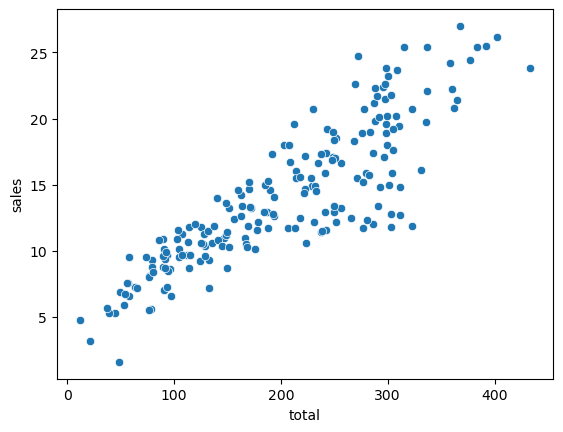

In [12]:
sns.scatterplot(x='total',y='sales',data=ad);

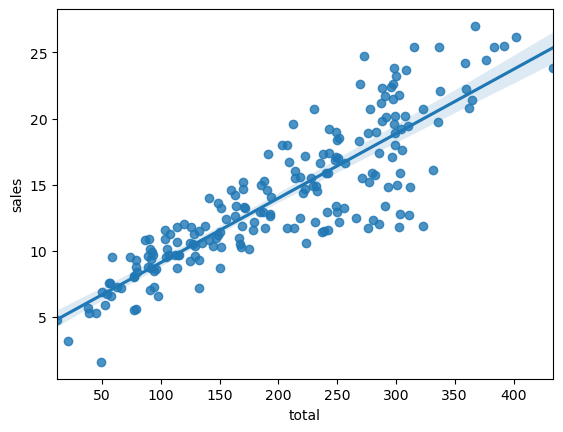

In [13]:
sns.regplot(x='total',y='sales',data=ad);

In [14]:
x = np.linspace(50,500,100)
y_pred = x*0.04868788 + 4.24302822

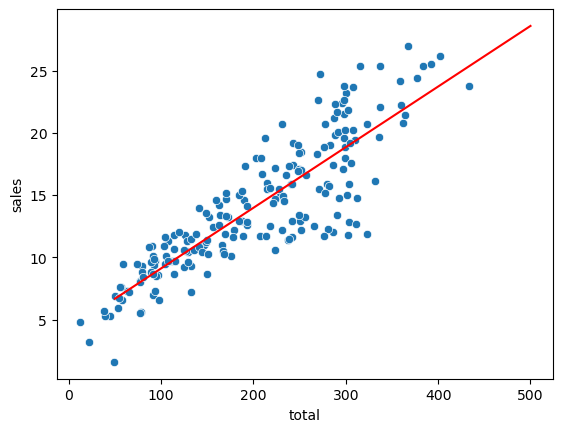

In [19]:
plt.plot(x,y_pred,'r')
sns.scatterplot(x='total',y='sales',data=ad);

In [20]:
200 * 0.04868788 + 4.24302822

13.98060422

# Линейная регрессия

In [31]:
ad = pd.read_csv("Advertising.csv")
ad.head()

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9


**Разобьём данные на признаки и целевую переменную**

In [32]:
X = ad.drop('sales',1)
y = ad['sales']

In [33]:
X.head()

,TV,radio,newspaper
0,230.1,37.8,69.2
1,44.5,39.3,45.1
2,17.2,45.9,69.3
3,151.5,41.3,58.5
4,180.8,10.8,58.4


In [34]:
y.head()

0    22.1
1    10.4
2     9.3
3    18.5
4    12.9
Name: sales, dtype: float64

**Разобьём данные на тестовые и тренировочные**

In [35]:
from sklearn.model_selection import train_test_split

In [36]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3,random_state=101)

**Создадим модель**

In [37]:
from sklearn.linear_model import LinearRegression

In [38]:
model = LinearRegression()

In [39]:
model.fit(X_train,y_train)

LinearRegression()

In [40]:
test_pred = model.predict(X_test)
test_pred

array([15.74131332, 19.61062568, 11.44888935, 17.00819787,  9.17285676,
        7.01248287, 20.28992463, 17.29953992,  9.77584467, 19.22194224,
       12.40503154, 13.89234998, 13.72541098, 21.28794031, 18.42456638,
        9.98198406, 15.55228966,  7.68913693,  7.55614992, 20.40311209,
        7.79215204, 18.24214098, 24.68631904, 22.82199068,  7.97962085,
       12.65207264, 21.46925937,  8.05228573, 12.42315981, 12.50719678,
       10.77757812, 19.24460093, 10.070269  ,  6.70779999, 17.31492147,
        7.76764327,  9.25393336,  8.27834697, 10.58105585, 10.63591128,
       13.01002595,  9.77192057, 10.21469861,  8.04572042, 11.5671075 ,
       10.08368001,  8.99806574, 16.25388914, 13.23942315, 20.81493419,
       12.49727439, 13.96615898, 17.56285075, 11.14537013, 12.56261468,
        5.50870279, 23.29465134, 12.62409688, 18.77399978, 15.18785675])

**Посмотрим ошибку**

In [41]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [42]:
MAE = mean_absolute_error(y_test,test_pred)
MSE = mean_squared_error(y_test,test_pred)
RMSE = np.sqrt(MSE)

In [43]:
MAE

1.2137457736144808

In [44]:
MSE

2.2987166978863773

In [45]:
RMSE

1.5161519375993877

In [46]:
ad['sales'].mean()

14.0225

In [48]:
np.round(RMSE/ad['sales'].mean(), 2)

0.11

In [27]:
quartet = pd.read_csv('anscombes_quartet1.csv')

In [28]:
quartet

,x,y
0,10.0,8.04
1,8.0,6.95
2,13.0,7.58
3,9.0,8.81
4,11.0,8.33
5,14.0,9.96
6,6.0,7.24
7,4.0,4.26
8,12.0,10.84
9,7.0,4.82


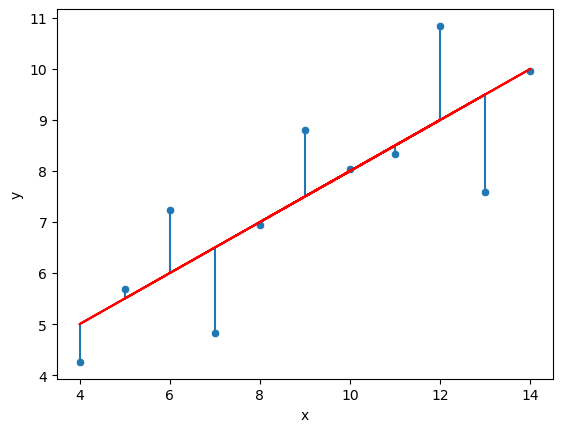

In [39]:
quartet['pred_y'] = 3 + 0.5*quartet['x']
sns.scatterplot(x='x',y='y',data=quartet)
plt.plot(quartet['x'],quartet['pred_y'],'r')
plt.vlines(quartet['x'],quartet['y'],quartet['pred_y']);

In [36]:
quartet['residual'] = quartet['y'] - quartet['pred_y']

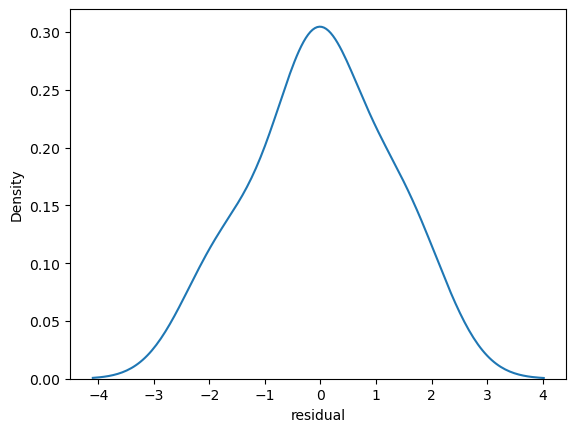

In [37]:
sns.kdeplot(data=quartet['residual']);

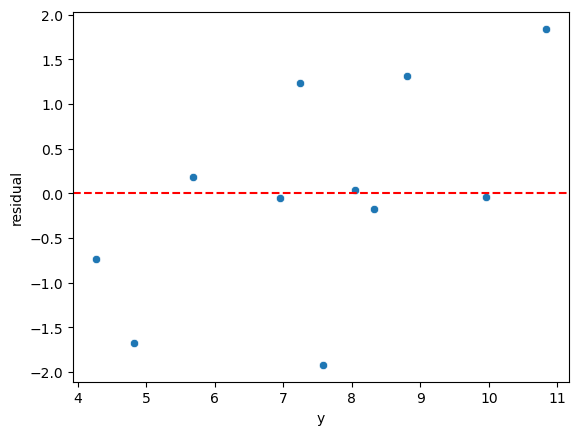

In [38]:
sns.scatterplot(data=quartet,x='y',y='residual')
plt.axhline(y=0, color='r', linestyle='--');

In [41]:
test_res = y_test - test_pred

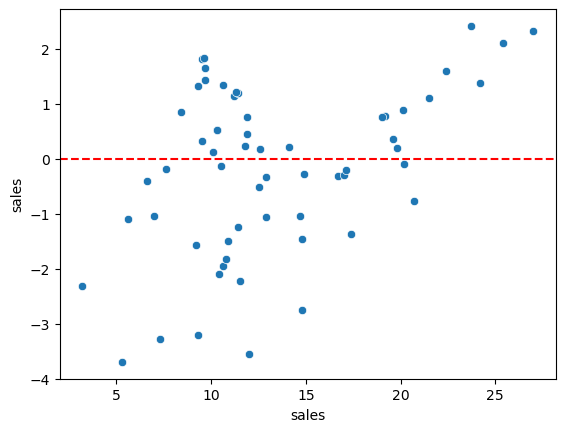

In [42]:
sns.scatterplot(x=y_test,y=test_res)
plt.axhline(y=0, color='r', linestyle='--');

In [32]:
fin_model = LinearRegression()

In [33]:
fin_model.fit(X,y)

LinearRegression()

In [34]:
fin_model.coef_

array([ 0.04576465,  0.18853002, -0.00103749])

In [35]:
y_hat = fin_model.predict(X)

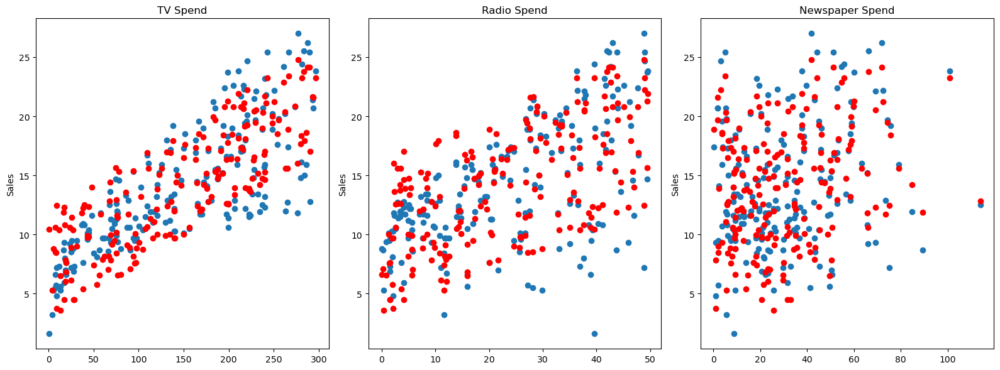

In [36]:
fig,axes = plt.subplots(nrows=1,ncols=3,figsize=(16,6))

axes[0].plot(ad['TV'],ad['sales'],'o')
axes[0].plot(ad['TV'],y_hat,'o',color='red')
axes[0].set_ylabel("Sales")
axes[0].set_title("TV Spend")

axes[1].plot(ad['radio'],ad['sales'],'o')
axes[1].plot(ad['radio'],y_hat,'o',color='red')
axes[1].set_title("Radio Spend")
axes[1].set_ylabel("Sales")

axes[2].plot(ad['newspaper'],ad['sales'],'o')
axes[2].plot(ad['newspaper'],y_hat,'o',color='red')
axes[2].set_title("Newspaper Spend");
axes[2].set_ylabel("Sales")
plt.tight_layout();

**Сохраняем модель**

In [7]:
from joblib import dump,load

In [ ]:
dump(fin_model,'1st model.joblib')

In [ ]:
new_model = load('1st model.joblib')

In [41]:
campaign = [[0,250,0]]

In [42]:
fin_model.predict(campaign)

array([50.0713936])

# Полиномиальная регрессия


In [8]:
from sklearn.preprocessing import PolynomialFeatures

In [106]:
pol_converter = PolynomialFeatures(degree=2,include_bias=False)

In [107]:
pol_features = pol_converter.fit_transform(X)

In [108]:
X.head()

,TV,radio,newspaper
0,230.1,37.8,69.2
1,44.5,39.3,45.1
2,17.2,45.9,69.3
3,151.5,41.3,58.5
4,180.8,10.8,58.4


In [109]:
pol_features.shape

(200, 9)

In [110]:
X_train, X_test, y_train, y_test = train_test_split(pol_features, y, test_size=0.3, random_state=101)

In [111]:
pmodel = LinearRegression()

In [112]:
pmodel.fit(X_train,y_train)

LinearRegression()

In [113]:
ppredictions = pmodel.predict(X_test)

In [114]:
MAE = mean_absolute_error(y_test,ppredictions)
MSE = mean_squared_error(y_test,ppredictions)
RMSE = np.sqrt(MSE)

In [115]:
MAE

0.48967980448035575

In [116]:
MSE

0.44175055104033906

In [117]:
RMSE

0.6646431757269001

In [118]:
np.round(RMSE/ad['sales'].mean(),2)

0.05

In [119]:
cam = [[0,250,0]]

In [120]:
p_cam = pol_converter.transform(cam)
p_cam

array([[    0.,   250.,     0.,     0.,     0.,     0., 62500.,     0.,
            0.]])

In [121]:
pmodel.predict(p_cam)

array([10.49002739])

**Выясним оптимальную степень полинома**

In [123]:
train_errors = []
test_errors = []

for d in range(1,6):
    pol_conv = PolynomialFeatures(degree=d, include_bias=False)
    pol_fs = pol_conv.fit_transform(X)
    X_train, X_test, y_train, y_test = train_test_split(pol_fs, y, test_size=0.3, random_state=101)
    m = LinearRegression()
    m.fit(X_train,y_train)
    m_train_pred = m.predict(X_train)
    m_test_pred = m.predict(X_test)

    
    train_error = np.sqrt(mean_squared_error(y_train,m_train_pred))
    test_error = np.sqrt(mean_squared_error(y_test,m_test_pred))
    train_errors.append(train_error)
    test_errors.append(test_error)


In [127]:
train_errors

[1.734594124329376,
 0.5879574085292231,
 0.4339344356902068,
 0.35170836883993584,
 0.2509342959376094]

In [128]:
test_errors

[1.516151937599388,
 0.6646431757269001,
 0.5803286825237266,
 0.5077742654793547,
 2.5758053618843464]

*Ошибки предсказаний на тренировочных данных постепенно падают, в то время как ошибки на новых данных с какого-то момента начинают резко расти. Это значит, что модель переобучена.*

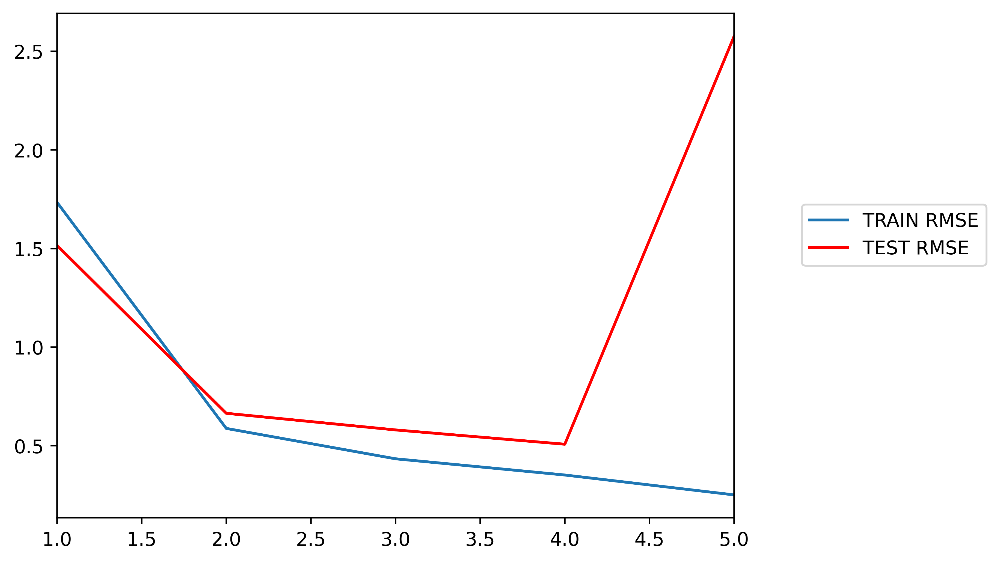

In [131]:
plt.figure(dpi=500)
plt.plot(range(1,6),train_errors,label='TRAIN RMSE')
plt.plot(range(1,6),test_errors,'r',label='TEST RMSE')
plt.xlim([1,5])
plt.legend(loc=[1.1,0.5]);

# Регуляризация

In [4]:
ad = pd.read_csv("Advertising.csv")
ad.head()

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9


In [5]:
X = ad.drop('sales',1)
X.head()

,TV,radio,newspaper
0,230.1,37.8,69.2
1,44.5,39.3,45.1
2,17.2,45.9,69.3
3,151.5,41.3,58.5
4,180.8,10.8,58.4


In [6]:
y = ad['sales']
y.head()

0    22.1
1    10.4
2     9.3
3    18.5
4    12.9
Name: sales, dtype: float64

In [7]:
poly_con = PolynomialFeatures(degree=3,include_bias=False)

In [8]:
X_poly = poly_con.fit_transform(X)

In [9]:
X_poly.shape

(200, 19)

In [10]:
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.3, random_state=101)

**Масштабирование**

In [11]:
from sklearn.preprocessing import StandardScaler

In [12]:
scaler = StandardScaler()

In [13]:
scaler.fit(X_train)

StandardScaler()

In [14]:
X_train = scaler.transform(X_train)

In [15]:
X_test = scaler.transform(X_test)

**L2**

In [16]:
from sklearn.linear_model import Ridge

In [17]:
ridge_model = Ridge(alpha=10)

In [18]:
ridge_model.fit(X_train,y_train)

Ridge(alpha=10)

In [19]:
r_pred = ridge_model.predict(X_test)

In [20]:
MAE = mean_absolute_error(y_test,r_pred)
MAE

0.5774404204714171

In [22]:
SME = mean_squared_error(y_test,r_pred)
SME

0.8003783071528395

In [23]:
RMSE = np.sqrt(SME)
RMSE

0.8946386461319674

In [24]:
from sklearn.linear_model import RidgeCV

In [31]:
ridge_CV_model = RidgeCV(scoring='neg_mean_absolute_error')

In [32]:
ridge_CV_model.fit(X_train,y_train)

RidgeCV(alphas=array([ 0.1,  1. , 10. ]), scoring='neg_mean_absolute_error')

In [33]:
ridge_CV_model.alpha_

0.1

In [28]:
from sklearn.metrics import SCORERS

In [30]:
SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])

In [35]:
r_CV_pred = ridge_CV_model.predict(X_test)

In [36]:
MAE = mean_absolute_error(y_test,r_CV_pred)
MAE

0.427377488434342

In [37]:
SME = mean_squared_error(y_test,r_CV_pred)
SME

0.38201298815554446

In [38]:
RMSE = np.sqrt(SME)
RMSE

0.6180719926962752

**L1**

In [39]:
from sklearn.linear_model import LassoCV

In [40]:
l_model = LassoCV(max_iter=1000000)

In [41]:
l_model.fit(X_train,y_train)

LassoCV(max_iter=1000000)

In [42]:
l_model.alpha_

0.004943070909225827

In [43]:
test_predictions = l_model.predict(X_test)

In [44]:
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [45]:
MAE

0.43350346185900673

In [46]:
MSE

0.3676167574199064

In [47]:
RMSE

0.6063140748984032

In [48]:
l_model.coef_

array([ 4.86023329,  0.12544598,  0.20746872, -4.99250395,  4.38026519,
       -0.22977201, -0.        ,  0.07267717, -0.        ,  1.77780246,
       -0.69614918, -0.        ,  0.12044132, -0.        , -0.        ,
       -0.        ,  0.        ,  0.        , -0.        ])

In [49]:
ad['sales'].mean()

14.0225

In [51]:
np.round(RMSE/ad['sales'].mean(),2)

0.04

**L1/L2**

In [52]:
from sklearn.linear_model import ElasticNetCV

In [53]:
elastic_model = ElasticNetCV(l1_ratio=[.1, .5, .7,.9, .95, .99, 1],max_iter=1000000)

In [54]:
elastic_model.fit(X_train,y_train)

ElasticNetCV(l1_ratio=[0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1], max_iter=1000000)

In [55]:
elastic_model.l1_ratio_

1.0

In [56]:
test_predictions = elastic_model.predict(X_test)

In [57]:
MAE = mean_absolute_error(y_test,test_predictions)
MSE = mean_squared_error(y_test,test_predictions)
RMSE = np.sqrt(MSE)

In [58]:
MAE

0.43350346185900673

In [59]:
MSE

0.3676167574199064

In [60]:
RMSE

0.6063140748984032

# Кросс-валидация 

**Train | Test**

### Разбиваем данные на обучающий и тестовый наборы данных - Train | Test Split

0. Очищаем и масштабируем данные X и y (при необходимости)
1. Разбиваем данные на обучающий и тестовый наборы данных - как для X, так и для y
2. Обучаем объект Scaler на обучающих данных X
3. Применяем масштабирование (scale) для тестовых данных X
4. Создаём модель
5. Обучаем модель на обучающих данных X
6. Оцениваем модель на тестовых данных X (создавая предсказания и сравнивая их с Y_test)
7. Уточняем параметры модели, повторяя шаги 5 и 6

In [5]:
df = pd.read_csv('Advertising.csv')
df.head()

,TV,radio,newspaper,sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,9.3
3,151.5,41.3,58.5,18.5
4,180.8,10.8,58.4,12.9


**0**

In [6]:
X = df.drop('sales', axis=1)
y = df['sales']

**1**

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

**2-3**

In [8]:
scaler = StandardScaler()

In [9]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

**4**

In [10]:
from sklearn.linear_model import Ridge

In [11]:
model = Ridge(alpha=100) # без кросс-валидации в RidgeCV мы должны подбирать гиперпараметры вручную

**5**

In [18]:
model.fit(X_train,y_train)

Ridge(alpha=100)

In [19]:
y_pred = model.predict(X_test)

**6**

In [20]:
mean_squared_error(y_test, y_pred)

7.34177578903413

**Train | Validation | Test**

Этот подход ещё называют методом с задержкой ("hold-out"), потому что здесь мы не настраиваем параметры модели на финальном тестовом наборе данных, а используем тестовые данные *только* для оценки финального результата.

0. Очищаем и масштабируем данные X и y (при необходимости)
1. Разбиваем данные на обучающий, оценочный и тестовый наборы данных - как для X, так и для y
2. Обучаем объект Scaler на обучающих данных X
3. Масштабируем (scale) оценочные данные X
4. Создаём модель
5. Обучаем модель на обучающих данных X
6. Оцениваем модель на оценочных данных X (создавая предсказания и сравнивая их с Y_eval)
7. Уточняем параметры модели, повторяя шаги 5 и 6
8. Вычисляем финальные метрики на тестовом наборе данных (после этого уже нельзя возвращаться и делать уточнения!)

In [16]:
X = df.drop('sales', axis=1)
y = df['sales']

In [59]:
X_train, X_other, y_train, y_other = train_test_split(X, y, test_size=0.3, random_state=101)

In [60]:
X_eval, X_test, y_eval, y_test = train_test_split(X_other, y_other, test_size=0.5, random_state=101)

In [61]:
scaler = StandardScaler()

In [62]:
scaler.fit(X_train)

StandardScaler()

In [63]:
X_train = scaler.transform(X_train)
X_eval = scaler.transform(X_eval)
X_test = scaler.transform(X_test)

In [64]:
model_one = Ridge(alpha=100)

In [65]:
model_one.fit(X_train, y_train)

Ridge(alpha=100)

In [66]:
y_eval_preds = model_one.predict(X_eval)

In [67]:
mean_squared_error(y_eval,y_eval_preds)

7.320101458823871

In [68]:
model_two = Ridge(alpha=1)

In [69]:
model_two.fit(X_train, y_train)

Ridge(alpha=1)

In [70]:
new_eval_preds = model_two.predict(X_eval)

In [71]:
mean_squared_error(y_eval,new_eval_preds)

2.3837830750569853

In [72]:
y_final_test_pred = model_two.predict(X_test)

In [73]:
mean_squared_error(y_test,y_final_test_pred)

2.254260083800517

## Cross_val_score()

<img src="grid_search_cross_validation.png">

In [3]:
from sklearn.model_selection import cross_val_score

In [28]:
scores = cross_val_score(model,X_train,y_train, cv=5, scoring='neg_mean_squared_error')

In [29]:
scores

array([ -9.32552967,  -4.9449624 , -11.39665242,  -7.0242106 ,
        -8.38562723])

In [30]:
abs(scores.mean())

8.215396464543609

In [34]:
scoress = []
for i in range(2,141):
    scores = cross_val_score(model,X_train,y_train, cv=i, scoring='neg_mean_squared_error')
    scoress.append(abs(scores.mean()))

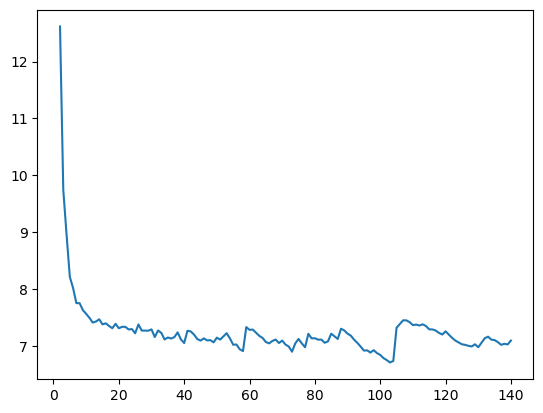

In [40]:
plt.plot(range(2,141), scoress);

In [39]:
np.min(scoress)

6.7096009774376535

## Cross_validate()

In [41]:
from sklearn.model_selection import cross_validate

In [46]:
scores = cross_validate(model, X_train, y_train, scoring=['neg_mean_absolute_error', 'neg_mean_squared_error'], cv=5)

In [47]:
scores = pd.DataFrame(scores)
scores

,fit_time,score_time,test_neg_mean_absolute_error,test_neg_mean_squared_error
0,0.000988,0.001390,-2.312430,-9.325530
1,0.001024,0.000546,-1.746534,-4.944962
2,0.000000,0.000000,-2.562117,-11.396652
3,0.001548,0.000000,-2.018732,-7.024211
4,0.000000,0.001548,-2.279519,-8.385627


In [48]:
scores.mean()

fit_time                        0.000712
score_time                      0.000697
test_neg_mean_absolute_error   -2.183866
test_neg_mean_squared_error    -8.215396
dtype: float64

## GridSearchCV

In [7]:
df = pd.read_csv('Advertising.csv')

In [8]:
## Создаём X и y
X = df.drop('sales',axis=1)
y = df['sales']

# Разбиение на обучающий и тестовый наборы - TRAIN TEST SPLIT
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

# Масштабирование данных (SCALE)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [4]:
from sklearn.linear_model import ElasticNet

In [9]:
base_elastic_model = ElasticNet()

In [10]:
param_grid = {'alpha':[0.1,1,5,10,50,100],
              'l1_ratio':[.1, .5, .7, .9, .95, .99, 1]}

In [11]:
from sklearn.model_selection import GridSearchCV

In [15]:
# число verbose - подробность логов
grid_model = GridSearchCV(estimator=base_elastic_model,
                          param_grid=param_grid,
                          scoring='neg_mean_squared_error',
                          cv=5,
                          verbose=2)

In [16]:
grid_model.fit(X_train, y_train)

Fitting 5 folds for each of 42 candidates, totalling 210 fits
[CV] alpha=0.1, l1_ratio=0.1 .........................................
[CV] .......................... alpha=0.1, l1_ratio=0.1, total=   0.0s
[CV] alpha=0.1, l1_ratio=0.1 .........................................
[CV] .......................... alpha=0.1, l1_ratio=0.1, total=   0.0s
[CV] alpha=0.1, l1_ratio=0.1 .........................................
[CV] .......................... alpha=0.1, l1_ratio=0.1, total=   0.0s
[CV] alpha=0.1, l1_ratio=0.1 .........................................
[CV] .......................... alpha=0.1, l1_ratio=0.1, total=   0.0s
[CV] alpha=0.1, l1_ratio=0.1 .........................................
[CV] .......................... alpha=0.1, l1_ratio=0.1, total=   0.0s
[CV] alpha=0.1, l1_ratio=0.5 .........................................
[CV] .......................... alpha=0.1, l1_ratio=0.5, total=   0.0s
[CV] alpha=0.1, l1_ratio=0.5 .........................................
[CV] ..........

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 210 out of 210 | elapsed:    0.1s finished


GridSearchCV(cv=5, estimator=ElasticNet(),
             param_grid={'alpha': [0.1, 1, 5, 10, 50, 100],
                         'l1_ratio': [0.1, 0.5, 0.7, 0.9, 0.95, 0.99, 1]},
             scoring='neg_mean_squared_error', verbose=2)

In [17]:
grid_model.best_estimator_

ElasticNet(alpha=0.1, l1_ratio=1)

In [18]:
grid_model.best_params_

{'alpha': 0.1, 'l1_ratio': 1}

In [19]:
pd.DataFrame(grid_model.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,param_l1_ratio,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,0.004582,7.672864e-03,0.000400,0.000490,0.1,0.1,"{'alpha': 0.1, 'l1_ratio': 0.1}",-3.453021,-1.405190,-5.789125,-2.187302,-4.645576,-3.496043,1.591601,7
1,0.000404,4.944899e-04,0.000200,0.000401,0.1,0.5,"{'alpha': 0.1, 'l1_ratio': 0.5}",-3.325440,-1.427522,-5.595610,-2.163089,-4.451679,-3.392668,1.506827,6
2,0.000685,5.803697e-04,0.000400,0.000490,0.1,0.7,"{'alpha': 0.1, 'l1_ratio': 0.7}",-3.269880,-1.442432,-5.502437,-2.163950,-4.356738,-3.347088,1.462765,5
3,0.000600,4.900184e-04,0.000200,0.000400,0.1,0.9,"{'alpha': 0.1, 'l1_ratio': 0.9}",-3.221397,-1.465339,-5.416447,-2.173493,-4.263887,-3.308112,1.417693,4
4,0.000400,4.899793e-04,0.000200,0.000400,0.1,0.95,"{'alpha': 0.1, 'l1_ratio': 0.95}",-3.213052,-1.472417,-5.396258,-2.177452,-4.241080,-3.300052,1.406248,3
5,0.000400,4.900960e-04,0.000600,0.000490,0.1,0.99,"{'alpha': 0.1, 'l1_ratio': 0.99}",-3.208124,-1.478489,-5.380242,-2.181097,-4.222968,-3.294184,1.396953,2
6,0.000400,4.899208e-04,0.000200,0.000400,0.1,1,"{'alpha': 0.1, 'l1_ratio': 1}",-3.206943,-1.480065,-5.376257,-2.182076,-4.218460,-3.292760,1.394613,1
7,0.000200,3.998756e-04,0.000200,0.000400,1,0.1,"{'alpha': 1, 'l1_ratio': 0.1}",-9.827475,-5.261525,-11.875347,-7.449195,-8.542329,-8.591174,2.222939,14
8,0.000400,4.899793e-04,0.000200,0.000400,1,0.5,"{'alpha': 1, 'l1_ratio': 0.5}",-8.707071,-4.214228,-10.879261,-6.204545,-7.173031,-7.435627,2.255532,13
9,0.000400,4.899208e-04,0.000200,0.000400,1,0.7,"{'alpha': 1, 'l1_ratio': 0.7}",-7.920870,-3.549562,-10.024877,-5.379553,-6.324836,-6.639940,2.206213,12


In [21]:
y_pred = grid_model.predict(X_test)

In [22]:
mean_squared_error(y_test,y_pred)

2.3873426420874737

## RandomizedSearchCV

In [3]:
from sklearn.model_selection import RandomizedSearchCV

Работает как GridSeachCV, но позволяет указывать в сетке параметров диапазоны значений гиперпараметров, из которых тот выбирает случайные

# Логистическая регрессия

In [5]:
df = pd.read_csv('hearing_test.csv')

**Нужно провести бинарную классификацию**

In [4]:
df

,age,physical_score,test_result
0,33.0,40.7,1
1,50.0,37.2,1
2,52.0,24.7,0
3,56.0,31.0,0
4,35.0,42.9,1
...,...,...,...
4995,73.0,3.9,0
4996,57.0,33.9,1
4997,49.0,34.5,1
4998,38.0,46.4,1


In [5]:
df.describe()

,age,physical_score,test_result
count,5000.000000,5000.000000,5000.000000
mean,51.609000,32.760260,0.600000
std,11.287001,8.169802,0.489947
min,18.000000,-0.000000,0.000000
25%,43.000000,26.700000,0.000000
50%,51.000000,35.300000,1.000000
75%,60.000000,38.900000,1.000000
max,90.000000,50.000000,1.000000


In [7]:
df['test_result'].value_counts()

1    3000
0    2000
Name: test_result, dtype: int64

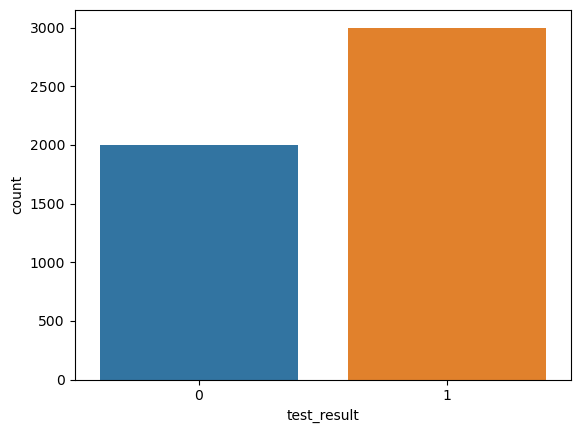

In [11]:
sns.countplot(data=df,x='test_result');

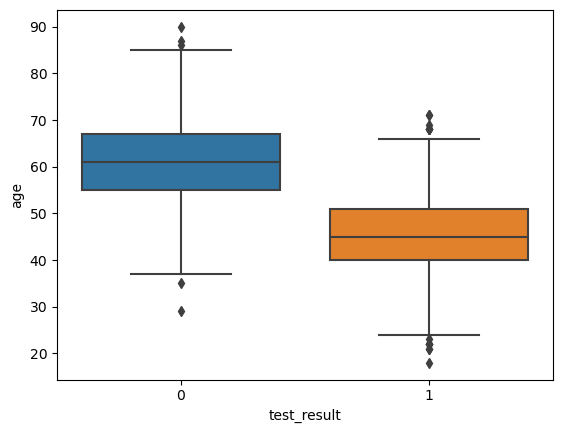

In [14]:
sns.boxplot(data=df,x='test_result',y='age');

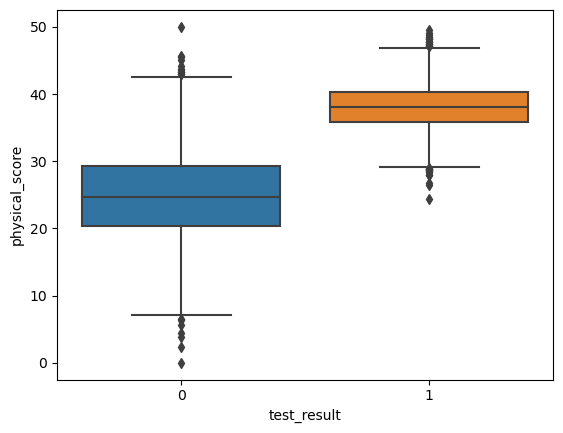

In [15]:
sns.boxplot(data=df,x='test_result',y='physical_score');

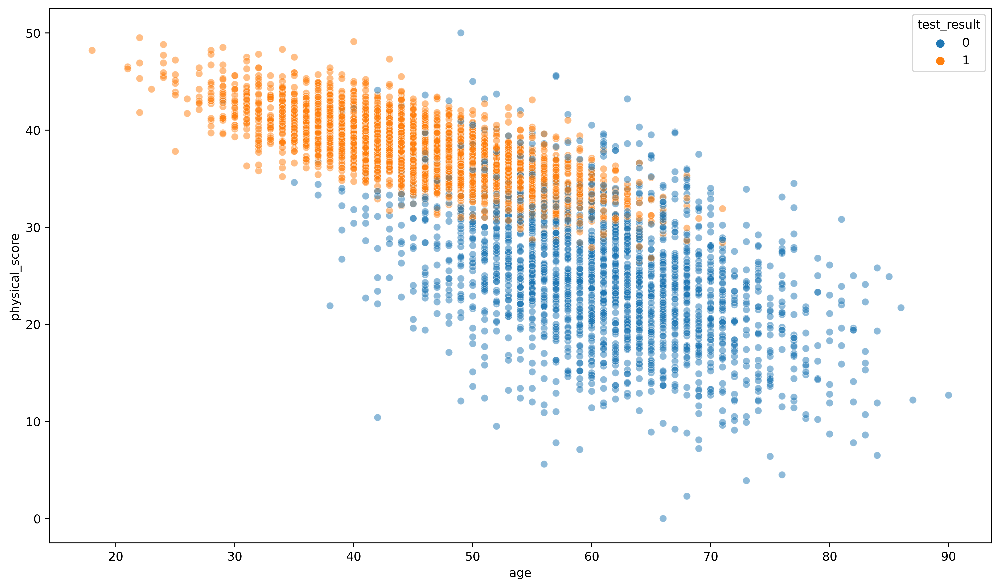

In [22]:
plt.figure(figsize=(14,8),dpi=500)
sns.scatterplot(data=df,x='age',y='physical_score',hue='test_result',alpha=0.5);

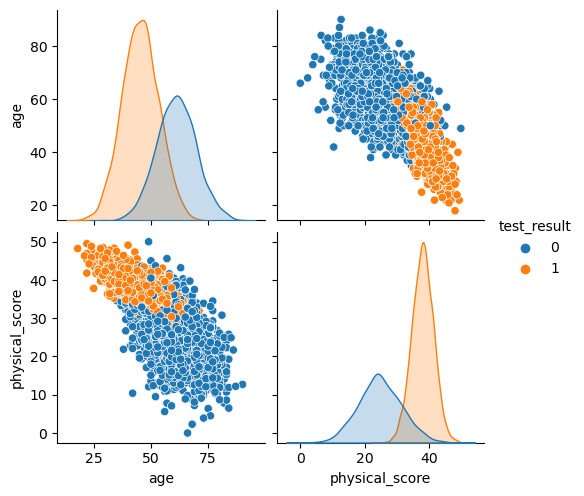

In [20]:
sns.pairplot(df,hue='test_result');

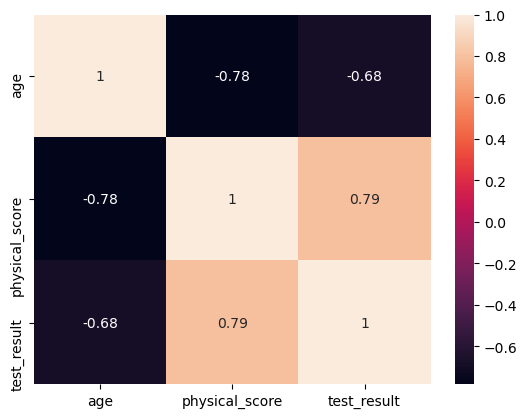

In [23]:
sns.heatmap(df.corr(),annot=True);

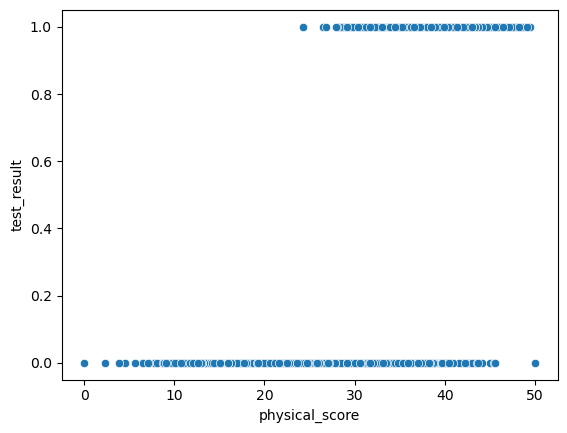

In [25]:
sns.scatterplot(data=df,x='physical_score',y='test_result');

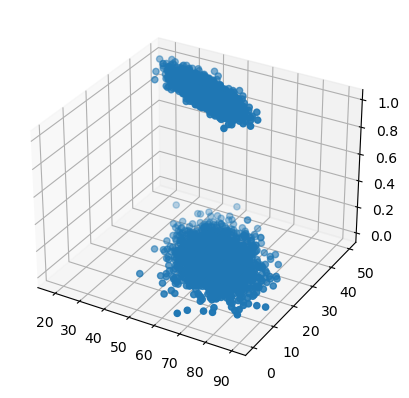

In [33]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

ax.scatter(df['age'],df['physical_score'],df['test_result']);

## Бинарная классификация

In [6]:
X = df.drop('test_result', axis = 1)
y = df['test_result']

In [7]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=101)

In [8]:
scaler = StandardScaler()

In [9]:
scaled_x_train = scaler.fit_transform(X_train)
scaled_x_test = scaler.transform(X_test)

In [10]:
from sklearn.linear_model import LogisticRegression

In [11]:
log_model = LogisticRegression()

In [12]:
log_model.fit(scaled_x_train,y_train)

LogisticRegression()

In [13]:
log_model.coef_

array([[-0.94953524,  3.45991194]])

In [14]:
y_preds = log_model.predict(scaled_x_test)
y_preds

array([1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1,

In [15]:
log_model.predict_proba(scaled_x_test)

array([[2.38434328e-02, 9.76156567e-01],
       [2.69240761e-02, 9.73075924e-01],
       [9.89194168e-01, 1.08058325e-02],
       [1.90768955e-03, 9.98092310e-01],
       [9.75012619e-01, 2.49873806e-02],
       [9.89652504e-01, 1.03474957e-02],
       [7.40226674e-02, 9.25977333e-01],
       [1.70943342e-02, 9.82905666e-01],
       [9.97066033e-01, 2.93396692e-03],
       [3.30521615e-02, 9.66947839e-01],
       [8.31035903e-02, 9.16896410e-01],
       [9.92865306e-03, 9.90071347e-01],
       [7.08965218e-03, 9.92910348e-01],
       [9.34236379e-01, 6.57636209e-02],
       [1.16594927e-04, 9.99883405e-01],
       [6.58904151e-02, 9.34109585e-01],
       [9.89126706e-01, 1.08732938e-02],
       [2.80051357e-03, 9.97199486e-01],
       [5.58920624e-04, 9.99441079e-01],
       [9.96523291e-01, 3.47670946e-03],
       [8.81757060e-01, 1.18242940e-01],
       [1.31030473e-01, 8.68969527e-01],
       [5.45646751e-01, 4.54353249e-01],
       [3.44064171e-02, 9.65593583e-01],
       [3.983864

In [16]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [17]:
accuracy_score(y_test,y_preds)

0.93

In [18]:
confusion_matrix(y_test,y_preds)

array([[172,  21],
       [ 14, 293]], dtype=int64)

In [19]:
from sklearn.metrics import plot_confusion_matrix

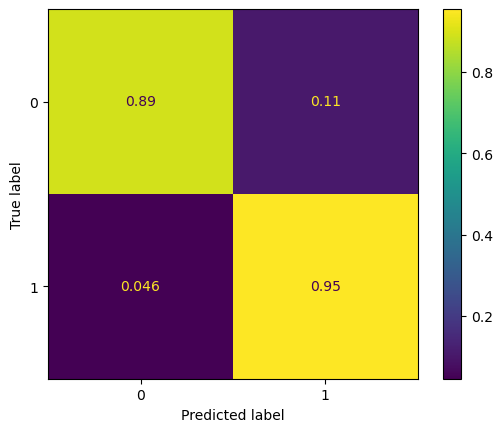

In [20]:
plot_confusion_matrix(log_model,scaled_x_test,y_test, normalize='true');

In [21]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.92      0.89      0.91       193
           1       0.93      0.95      0.94       307

    accuracy                           0.93       500
   macro avg       0.93      0.92      0.93       500
weighted avg       0.93      0.93      0.93       500



In [22]:
from sklearn.metrics import precision_score, recall_score

In [24]:
precision_score(y_test,y_preds)

0.9331210191082803

In [25]:
recall_score(y_test,y_preds)

0.9543973941368078

In [26]:
from sklearn.metrics import plot_precision_recall_curve, plot_roc_curve

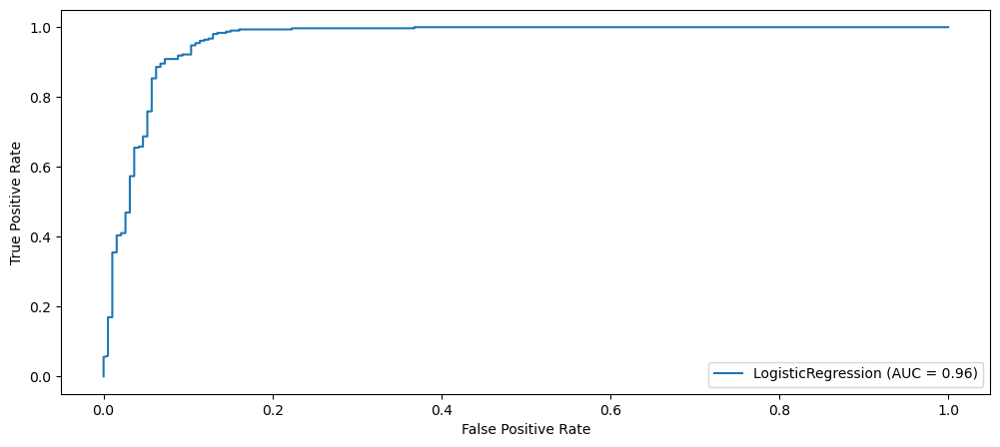

In [27]:
fig, ax = plt.subplots(figsize=(12,5))
plot_roc_curve(log_model,scaled_x_test,y_test,ax=ax);

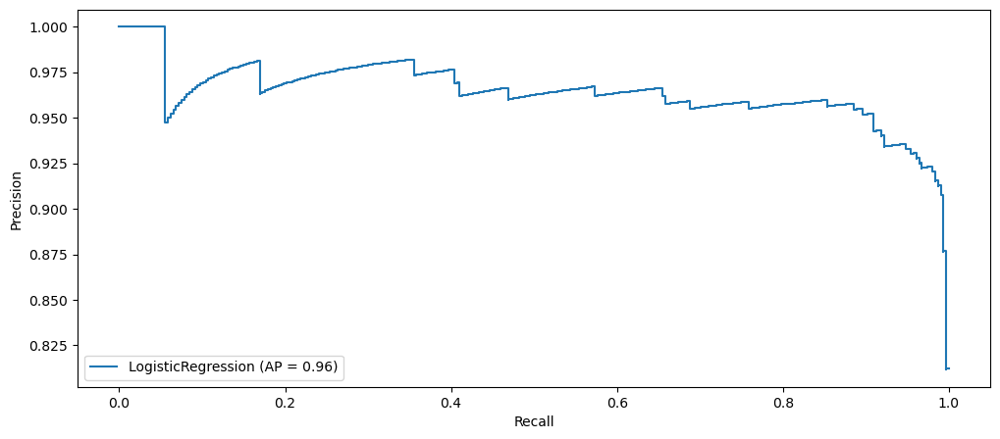

In [28]:
fig, ax = plt.subplots(figsize=(12,5))
plot_precision_recall_curve(log_model,scaled_x_test,y_test,ax=ax);

## Многоклассовая классификация

In [30]:
df = pd.read_csv('iris.csv')
df

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [31]:
df.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.054000,3.758667,1.198667
std,0.828066,0.433594,1.764420,0.763161
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [32]:
df['species'].value_counts()

versicolor    50
setosa        50
virginica     50
Name: species, dtype: int64

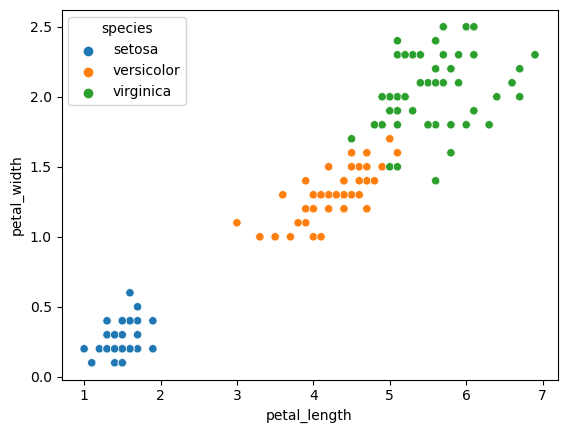

In [34]:
sns.scatterplot(data=df,x='petal_length',y='petal_width',hue='species');

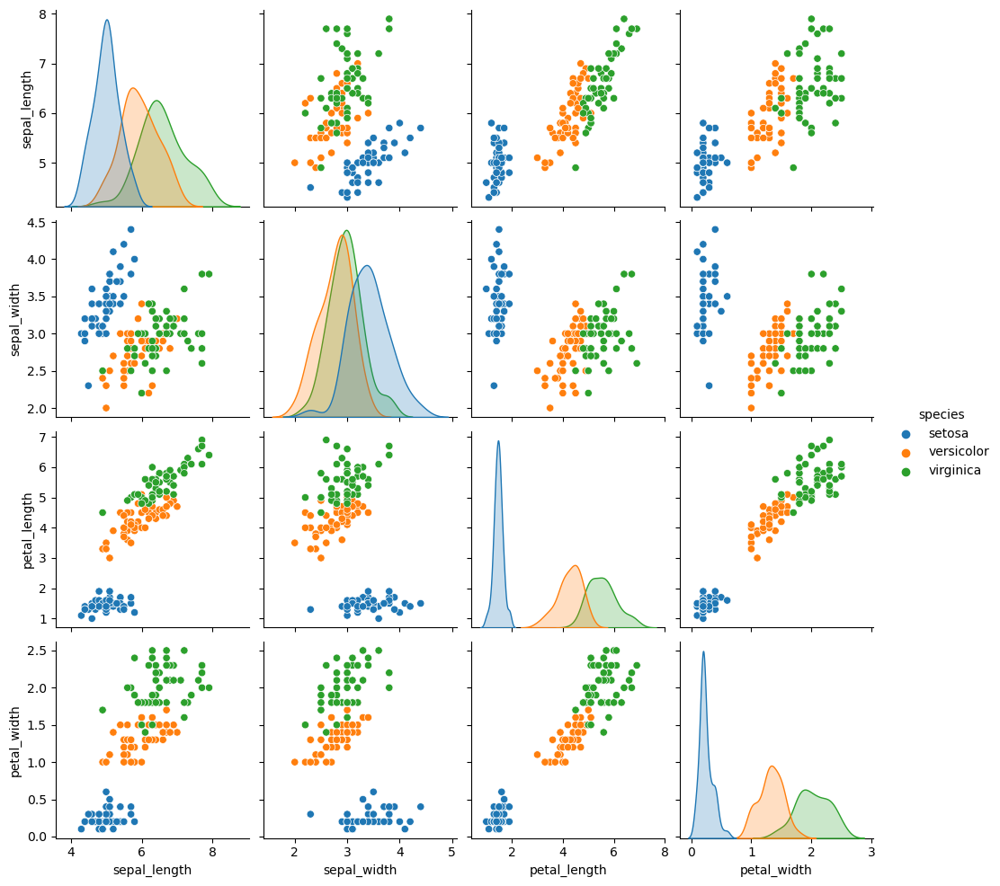

In [35]:
sns.pairplot(df,hue='species');

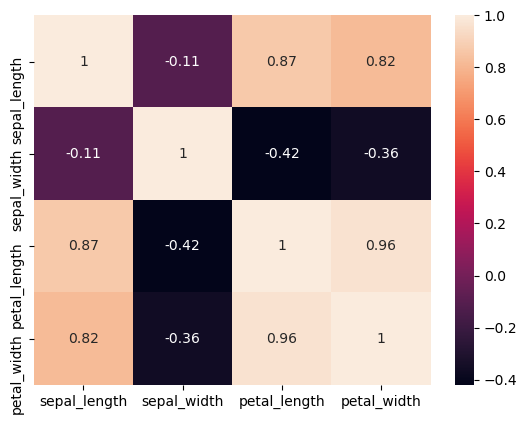

In [36]:
sns.heatmap(df.corr(),annot=True);

In [37]:
X = df.drop('species', axis=1)
y = df['species']

In [38]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=101)

In [39]:
scaler = StandardScaler()

In [40]:
scaled_x_train = scaler.fit_transform(X_train)
scaled_x_test = scaler.transform(X_test)

In [60]:
log_model = LogisticRegression()

In [61]:
log_model.fit(scaled_x_train,y_train)

LogisticRegression()

In [62]:
y_preds = log_model.predict(scaled_x_test)
y_preds

array(['setosa', 'setosa', 'setosa', 'virginica', 'versicolor',
       'virginica', 'versicolor', 'versicolor', 'virginica', 'setosa',
       'virginica', 'setosa', 'setosa', 'virginica', 'virginica',
       'versicolor', 'versicolor', 'versicolor', 'setosa', 'versicolor',
       'versicolor', 'setosa', 'versicolor', 'versicolor', 'versicolor',
       'versicolor', 'versicolor', 'virginica', 'setosa', 'setosa',
       'virginica', 'versicolor', 'virginica', 'versicolor', 'virginica',
       'versicolor', 'versicolor', 'versicolor'], dtype=object)

In [63]:
accuracy_score(y_test,y_preds)

0.9736842105263158

              precision    recall  f1-score   support

      setosa       1.00      1.00      1.00        10
  versicolor       0.94      1.00      0.97        17
   virginica       1.00      0.91      0.95        11

    accuracy                           0.97        38
   macro avg       0.98      0.97      0.97        38
weighted avg       0.98      0.97      0.97        38



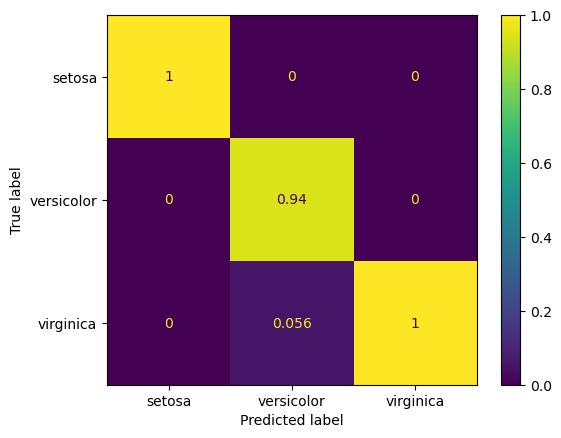

In [68]:
print(classification_report(y_test,y_preds))
plot_confusion_matrix(log_model,scaled_x_test,y_test,normalize='pred');

# KNN

In [3]:
df = pd.read_csv('gene_expression.csv')
df

,Gene One,Gene Two,Cancer Present
0,4.3,3.9,1
1,2.5,6.3,0
2,5.7,3.9,1
3,6.1,6.2,0
4,7.4,3.4,1
...,...,...,...
2995,5.0,6.5,1
2996,3.4,6.6,0
2997,2.7,6.5,0
2998,3.3,5.6,0


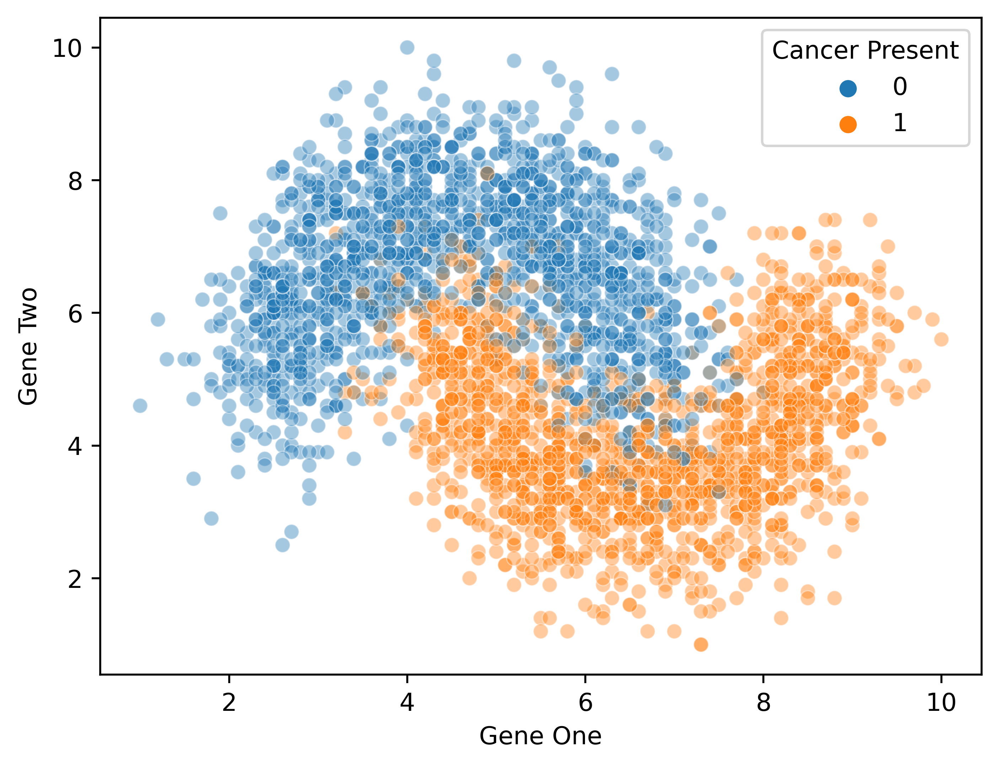

In [5]:
plt.figure(dpi=500)
sns.scatterplot(data=df, x='Gene One', y='Gene Two', hue='Cancer Present', alpha=0.4);

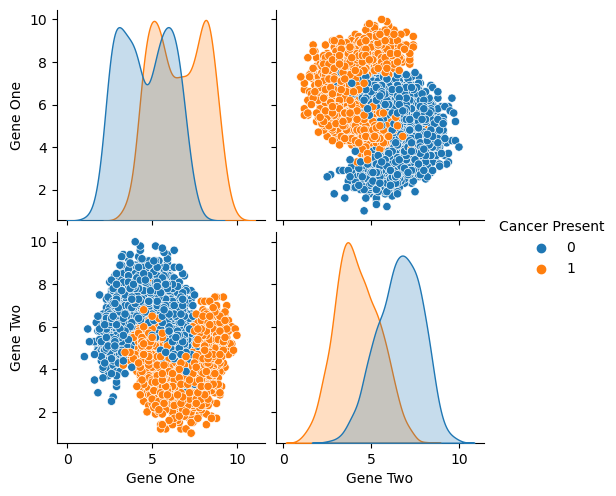

In [6]:
sns.pairplot(df,hue='Cancer Present');

In [7]:
X = df.drop('Cancer Present',axis=1)
y = df['Cancer Present']

In [9]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [10]:
scaler = StandardScaler()

In [11]:
scaled_x_train = scaler.fit_transform(X_train)
scaled_x_test = scaler.transform(X_test)

In [12]:
from sklearn.neighbors import KNeighborsClassifier

In [13]:
knn_model = KNeighborsClassifier(n_neighbors=1)

In [14]:
knn_model.fit(scaled_x_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [15]:
y_preds = knn_model.predict(scaled_x_test)

In [16]:
print(classification_report(y_test,y_preds))

              precision    recall  f1-score   support

           0       0.90      0.89      0.90       470
           1       0.88      0.89      0.89       430

    accuracy                           0.89       900
   macro avg       0.89      0.89      0.89       900
weighted avg       0.89      0.89      0.89       900



In [17]:
test_error_rates = []


for k in range(1,30,2):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(scaled_x_train,y_train) 
   
    y_pred_test = knn_model.predict(scaled_x_test)
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    test_error_rates.append(test_error)

In [18]:
test_error_rates

[0.10777777777777775,
 0.07444444444444442,
 0.07222222222222219,
 0.06444444444444442,
 0.06000000000000005,
 0.06222222222222218,
 0.06222222222222218,
 0.06000000000000005,
 0.05555555555555558,
 0.053333333333333344,
 0.054444444444444406,
 0.054444444444444406,
 0.05666666666666664,
 0.05555555555555558,
 0.05777777777777782]

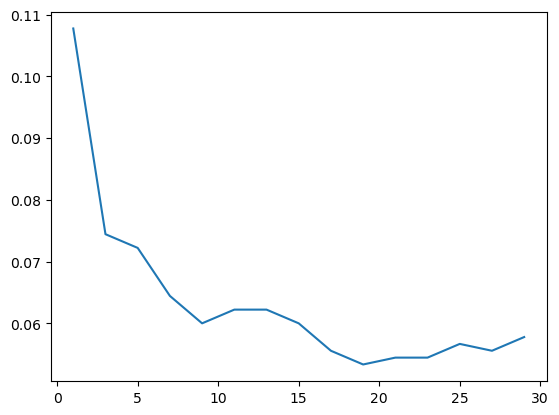

In [22]:
plt.plot(range(1,30,2),test_error_rates);

**PIPELINE**

In [23]:
scaler = StandardScaler()

In [24]:
knn = KNeighborsClassifier()

In [27]:
knn.get_params().keys()

dict_keys(['algorithm', 'leaf_size', 'metric', 'metric_params', 'n_jobs', 'n_neighbors', 'p', 'weights'])

In [29]:
operations = [('scaler',scaler),('knn',knn)]

In [28]:
from sklearn.pipeline import Pipeline

In [30]:
pipe = Pipeline(operations)

In [31]:
k_values = list(range(1,30,2))

In [34]:
param_grid = {'knn__n_neighbors':k_values}

In [35]:
full_cv_classifier = GridSearchCV(pipe,param_grid,cv=5,scoring='accuracy',n_jobs=-1)

In [36]:
full_cv_classifier.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('knn', KNeighborsClassifier())]),
             n_jobs=-1,
             param_grid={'knn__n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15, 17, 19,
                                              21, 23, 25, 27, 29]},
             scoring='accuracy')

In [37]:
full_cv_classifier.best_estimator_.get_params()

{'memory': None,
 'steps': [('scaler', StandardScaler()),
  ('knn', KNeighborsClassifier(n_neighbors=29))],
 'verbose': False,
 'scaler': StandardScaler(),
 'knn': KNeighborsClassifier(n_neighbors=29),
 'scaler__copy': True,
 'scaler__with_mean': True,
 'scaler__with_std': True,
 'knn__algorithm': 'auto',
 'knn__leaf_size': 30,
 'knn__metric': 'minkowski',
 'knn__metric_params': None,
 'knn__n_jobs': None,
 'knn__n_neighbors': 29,
 'knn__p': 2,
 'knn__weights': 'uniform'}

In [40]:
full_preds = full_cv_classifier.predict(X_test)

In [41]:
print(classification_report(y_test,full_preds))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95       470
           1       0.95      0.93      0.94       430

    accuracy                           0.94       900
   macro avg       0.94      0.94      0.94       900
weighted avg       0.94      0.94      0.94       900



In [42]:
new_patient = [[3.8, 6.4]]

In [43]:
full_cv_classifier.predict(new_patient)

array([0], dtype=int64)

In [44]:
full_cv_classifier.predict_proba(new_patient)

array([[0.93103448, 0.06896552]])

# SVM

In [4]:
df = pd.read_csv('mouse_viral_study.csv')
df

,Med_1_mL,Med_2_mL,Virus Present
0,6.508231,8.582531,0
1,4.126116,3.073459,1
2,6.427870,6.369758,0
3,3.672953,4.905215,1
4,1.580321,2.440562,1
...,...,...,...
395,2.884122,3.271748,1
396,7.290855,9.488672,0
397,7.895325,8.272529,0
398,2.690592,2.674979,1


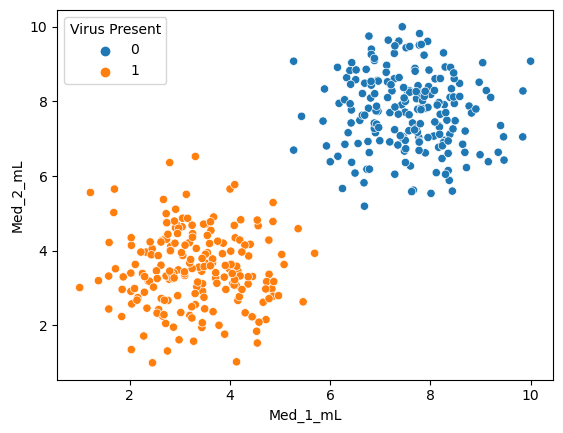

In [5]:
sns.scatterplot(data=df,x='Med_1_mL',y='Med_2_mL',hue='Virus Present');

In [6]:
from sklearn.svm import SVC

In [7]:
X = df.drop('Virus Present',axis=1)
y = df['Virus Present']

In [51]:
model = SVC(kernel='linear',C=1000)

In [52]:
model.fit(X,y)

SVC(C=1000, kernel='linear')

In [53]:
from svm_margin_plot import plot_svm_boundary

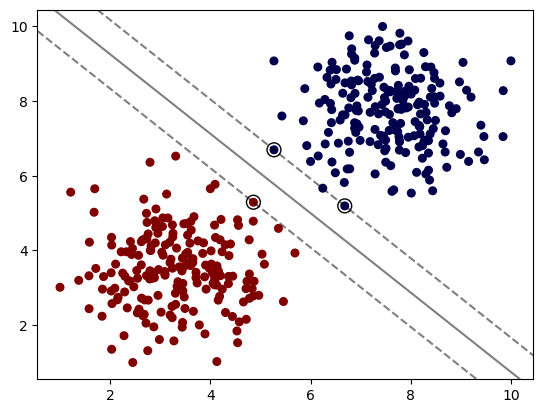

In [54]:
plot_svm_boundary(model,X,y)

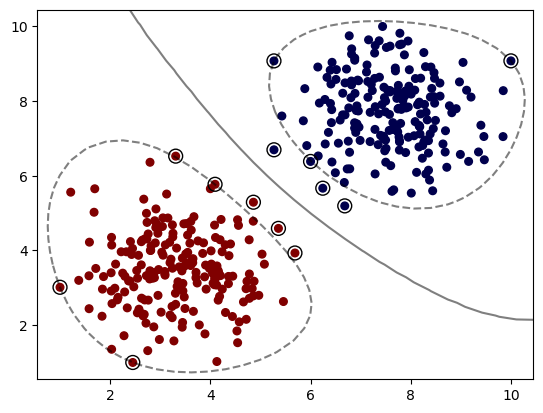

In [55]:
model = SVC(kernel='rbf',C=1)
model.fit(X,y)
plot_svm_boundary(model,X,y)

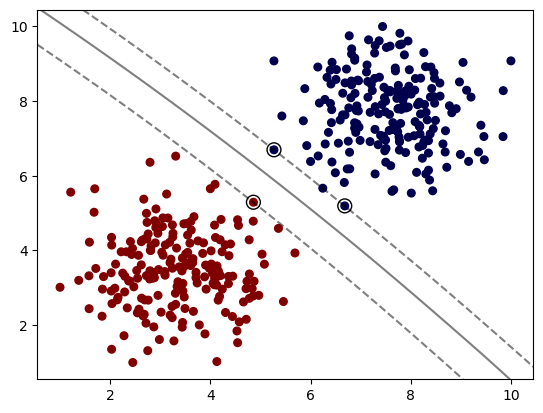

In [56]:
model = SVC(kernel='poly',degree=4)
model.fit(X,y)
plot_svm_boundary(model,X,y)

In [3]:
df = pd.read_csv('cement_slump.csv')
df

,Cement,Slag,Fly ash,Water,SP,Coarse Aggr.,Fine Aggr.,SLUMP(cm),FLOW(cm),Compressive Strength (28-day)(Mpa)
0,273.0,82.0,105.0,210.0,9.0,904.0,680.0,23.0,62.0,34.99
1,163.0,149.0,191.0,180.0,12.0,843.0,746.0,0.0,20.0,41.14
2,162.0,148.0,191.0,179.0,16.0,840.0,743.0,1.0,20.0,41.81
3,162.0,148.0,190.0,179.0,19.0,838.0,741.0,3.0,21.5,42.08
4,154.0,112.0,144.0,220.0,10.0,923.0,658.0,20.0,64.0,26.82
...,...,...,...,...,...,...,...,...,...,...
98,248.3,101.0,239.1,168.9,7.7,954.2,640.6,0.0,20.0,49.97
99,248.0,101.0,239.9,169.1,7.7,949.9,644.1,2.0,20.0,50.23
100,258.8,88.0,239.6,175.3,7.6,938.9,646.0,0.0,20.0,50.50
101,297.1,40.9,239.9,194.0,7.5,908.9,651.8,27.5,67.0,49.17


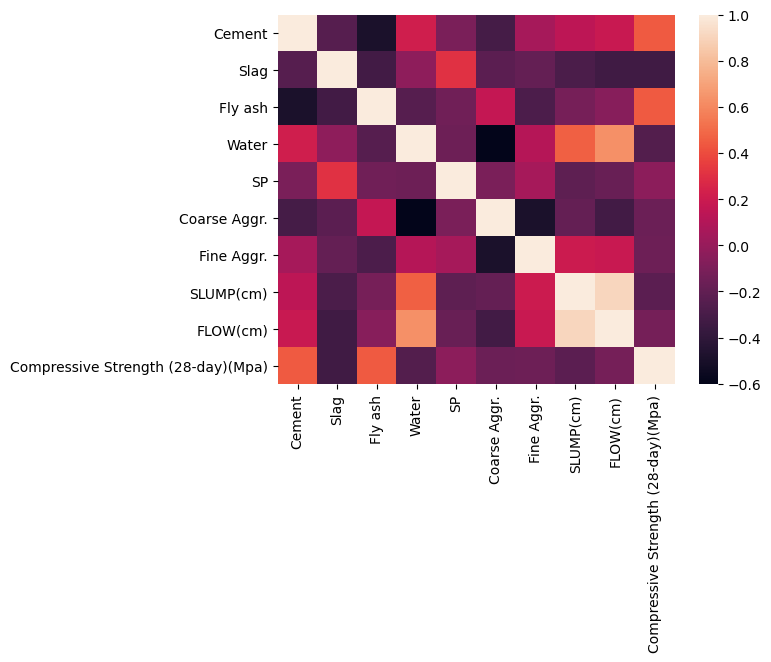

In [4]:
sns.heatmap(df.corr());

In [6]:
X = df.drop('Compressive Strength (28-day)(Mpa)',axis=1)
y = df['Compressive Strength (28-day)(Mpa)']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [10]:
scaler = StandardScaler()
scaled_x_train = scaler.fit_transform(X_train)
scaled_x_test = scaler.transform(X_test)

In [11]:
from sklearn.svm import SVR, LinearSVR

In [12]:
base_model = SVR()

In [13]:
base_model.fit(scaled_x_train,y_train)

SVR()

In [14]:
base_preds = base_model.predict(scaled_x_test)

In [17]:
mean_absolute_error(y_test,base_preds)

5.236902091259178

In [19]:
np.sqrt(mean_squared_error(y_test,base_preds))

6.695914838327133

In [20]:
y_test.mean()

36.26870967741935

In [24]:
param_grid = {'C':[0.001,0.01,0.1,0.5,1,5,10,50,100,500,1000],
             'kernel':['linear','rbf','poly'],
             'gamma':['scale','auto'],
             'degree':[2,3,4,5],
             'epsilon':[0,0.01,0.1,0.5,1,2]}

In [25]:
grid_model = GridSearchCV(base_model,param_grid,n_jobs=-1)

In [27]:
grid_model.fit(scaled_x_train,y_train)

GridSearchCV(estimator=SVR(), n_jobs=-1,
             param_grid={'C': [0.001, 0.01, 0.1, 0.5, 1, 5, 10, 50, 100, 500,
                               1000],
                         'degree': [2, 3, 4, 5],
                         'epsilon': [0, 0.01, 0.1, 0.5, 1, 2],
                         'gamma': ['scale', 'auto'],
                         'kernel': ['linear', 'rbf', 'poly']})

In [28]:
grid_model.best_estimator_

SVR(C=50, degree=2, epsilon=0, gamma='auto')

In [29]:
grid_model.best_params_

{'C': 50, 'degree': 2, 'epsilon': 0, 'gamma': 'auto', 'kernel': 'rbf'}

In [30]:
grid_preds = grid_model.predict(scaled_x_test)

In [31]:
mean_absolute_error(y_test,grid_preds)

1.947105403713788

In [32]:
np.sqrt(mean_squared_error(y_test,grid_preds))

2.9967310941158343

# Деревья решений

In [3]:
df = pd.read_csv('penguins_size.csv')

In [4]:
df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,MALE
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,FEMALE
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,FEMALE
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,FEMALE


In [5]:
df['species'].unique()

array(['Adelie', 'Chinstrap', 'Gentoo'], dtype=object)

In [7]:
df.isnull().sum() / len(df)

species              0.000000
island               0.000000
culmen_length_mm     0.005814
culmen_depth_mm      0.005814
flipper_length_mm    0.005814
body_mass_g          0.005814
sex                  0.029070
dtype: float64

In [8]:
df = df.dropna()

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 334 entries, 0 to 343
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   species            334 non-null    object 
 1   island             334 non-null    object 
 2   culmen_length_mm   334 non-null    float64
 3   culmen_depth_mm    334 non-null    float64
 4   flipper_length_mm  334 non-null    float64
 5   body_mass_g        334 non-null    float64
 6   sex                334 non-null    object 
dtypes: float64(4), object(3)
memory usage: 20.9+ KB


In [11]:
df['island'].unique()

array(['Torgersen', 'Biscoe', 'Dream'], dtype=object)

In [12]:
df['sex'].unique()

array(['MALE', 'FEMALE', '.'], dtype=object)

In [16]:
df[df['sex']=='.']

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
336,Gentoo,Biscoe,44.5,15.7,217.0,4875.0,.


In [17]:
df.at[336,'sex'] = 'FEMALE'

In [18]:
df.loc[336]

species              Gentoo
island               Biscoe
culmen_length_mm       44.5
culmen_depth_mm        15.7
flipper_length_mm       217
body_mass_g            4875
sex                  FEMALE
Name: 336, dtype: object

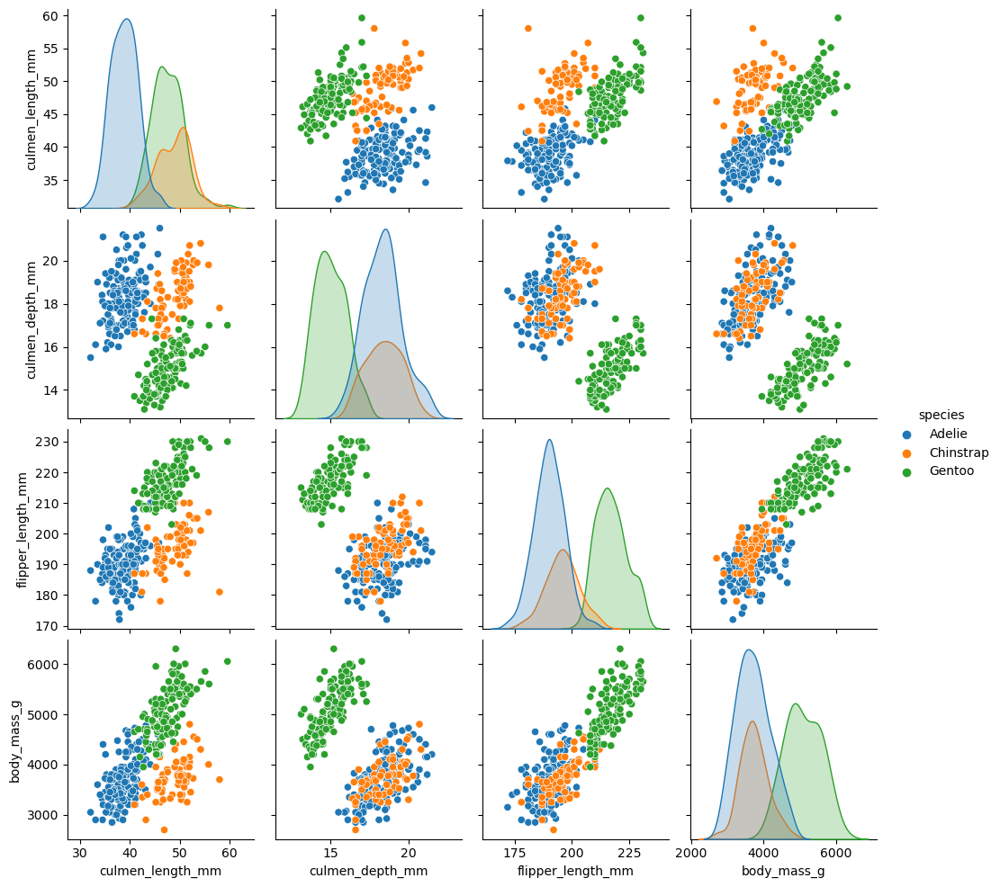

In [19]:
sns.pairplot(df,hue='species');

In [22]:
X = pd.get_dummies(df.drop('species',axis=1),drop_first=True)

In [23]:
y = df['species']

In [24]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [25]:
from sklearn.tree import DecisionTreeClassifier

In [26]:
model = DecisionTreeClassifier()

In [27]:
model.fit(X_train,y_train)

DecisionTreeClassifier()

In [29]:
base_preds = model.predict(X_test)
base_preds

array(['Chinstrap', 'Gentoo', 'Adelie', 'Chinstrap', 'Gentoo',
       'Chinstrap', 'Adelie', 'Gentoo', 'Chinstrap', 'Gentoo', 'Adelie',
       'Adelie', 'Adelie', 'Gentoo', 'Gentoo', 'Adelie', 'Gentoo',
       'Adelie', 'Adelie', 'Adelie', 'Gentoo', 'Chinstrap', 'Adelie',
       'Adelie', 'Adelie', 'Adelie', 'Chinstrap', 'Gentoo', 'Adelie',
       'Chinstrap', 'Gentoo', 'Adelie', 'Gentoo', 'Adelie', 'Adelie',
       'Chinstrap', 'Adelie', 'Gentoo', 'Chinstrap', 'Gentoo', 'Adelie',
       'Adelie', 'Gentoo', 'Adelie', 'Adelie', 'Chinstrap', 'Chinstrap',
       'Chinstrap', 'Chinstrap', 'Chinstrap', 'Adelie', 'Adelie',
       'Gentoo', 'Gentoo', 'Adelie', 'Adelie', 'Chinstrap', 'Chinstrap',
       'Gentoo', 'Adelie', 'Chinstrap', 'Gentoo', 'Adelie', 'Adelie',
       'Adelie', 'Gentoo', 'Chinstrap', 'Chinstrap', 'Gentoo', 'Gentoo',
       'Gentoo', 'Gentoo', 'Gentoo', 'Gentoo', 'Gentoo', 'Gentoo',
       'Gentoo', 'Gentoo', 'Adelie', 'Gentoo', 'Adelie', 'Adelie',
       'Gentoo', 'Adelie'

In [13]:
from sklearn.metrics import classification_report, plot_confusion_matrix

In [31]:
print(classification_report(y_test,base_preds))

              precision    recall  f1-score   support

      Adelie       0.95      1.00      0.98        41
   Chinstrap       1.00      0.91      0.95        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.98       101
   macro avg       0.98      0.97      0.98       101
weighted avg       0.98      0.98      0.98       101



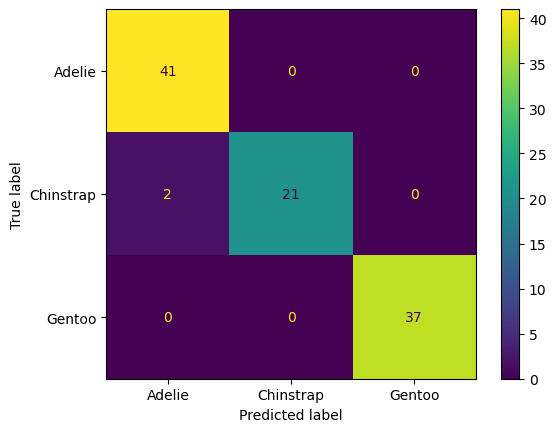

In [33]:
plot_confusion_matrix(model,X_test,y_test);

In [34]:
model.feature_importances_

array([0.3445481 , 0.04203954, 0.53120101, 0.00239775, 0.0681854 ,
       0.        , 0.0116282 ])

In [35]:
X.columns

Index(['culmen_length_mm', 'culmen_depth_mm', 'flipper_length_mm',
       'body_mass_g', 'island_Dream', 'island_Torgersen', 'sex_MALE'],
      dtype='object')

In [39]:
pd.DataFrame(index=X.columns,data=model.feature_importances_,columns=['Feature importance']).sort_values('Feature importance',ascending=False)

,Feature importance
flipper_length_mm,0.531201
culmen_length_mm,0.344548
island_Dream,0.068185
culmen_depth_mm,0.042040
sex_MALE,0.011628
body_mass_g,0.002398
island_Torgersen,0.000000


In [40]:
from sklearn.tree import plot_tree

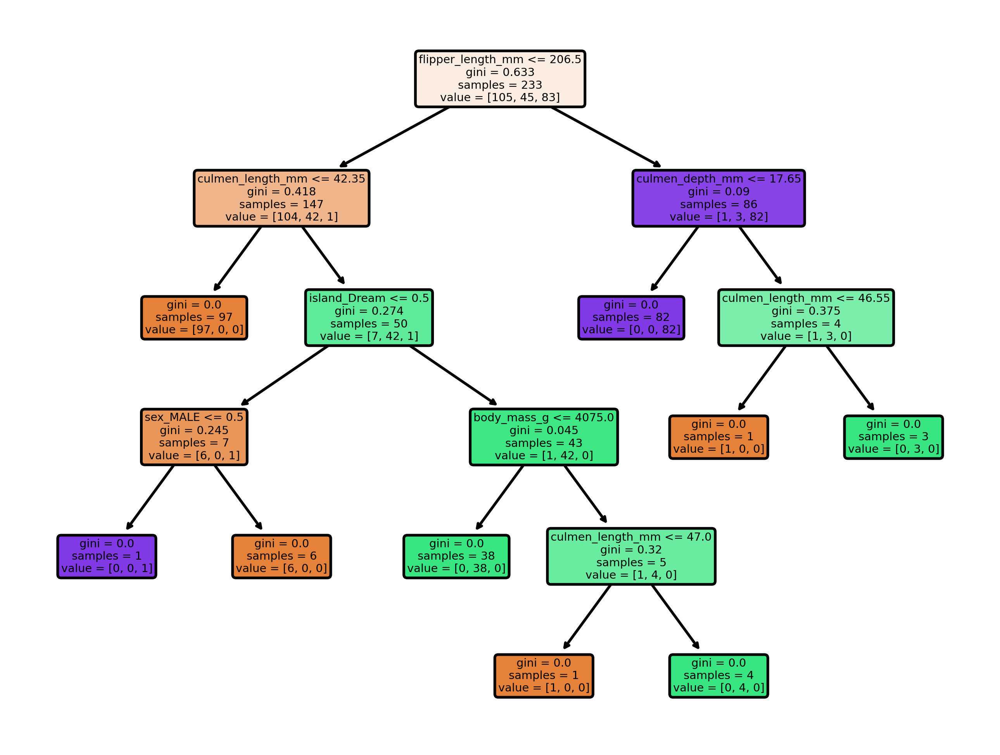

In [55]:
plt.figure(dpi=500)
plot_tree(model, rounded=True, feature_names=X.columns, filled=True);

In [56]:
def report_model(model):
    model_preds = model.predict(X_test)
    print(classification_report(y_test,model_preds))
    print('\n')
    plt.figure(dpi=200)
    plot_tree(model, rounded=True, feature_names=X.columns, filled=True);

In [61]:
pruned_tree = DecisionTreeClassifier(max_depth=3)

In [62]:
pruned_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3)

              precision    recall  f1-score   support

      Adelie       0.97      0.95      0.96        41
   Chinstrap       0.92      0.96      0.94        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.97       101
   macro avg       0.96      0.97      0.97       101
weighted avg       0.97      0.97      0.97       101





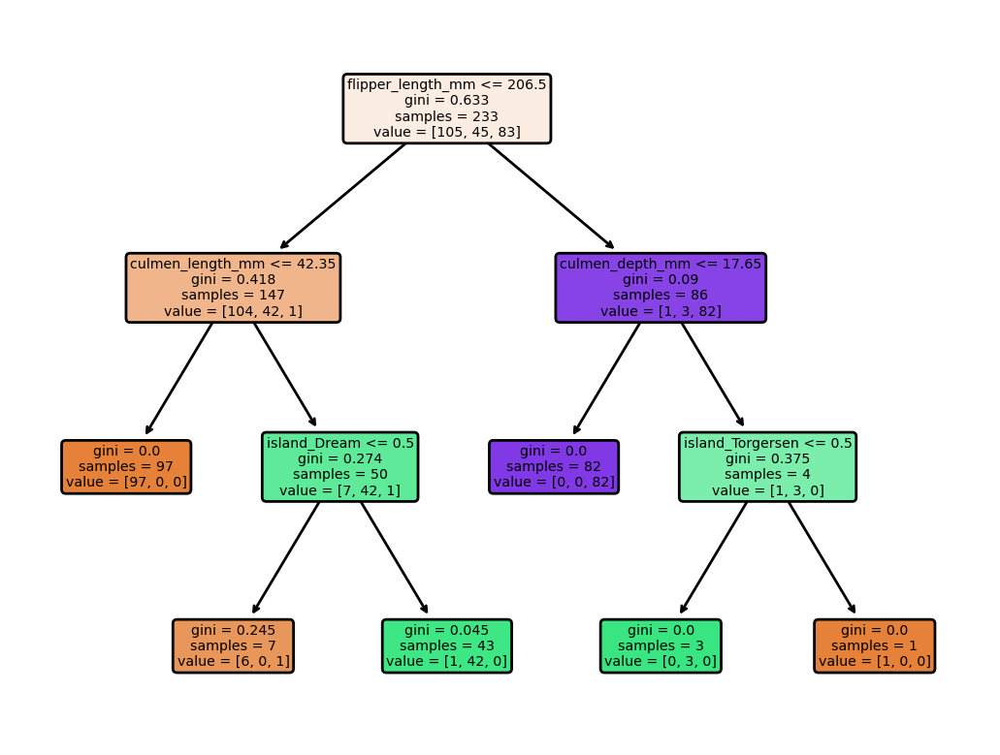

In [63]:
report_model(pruned_tree)

# Случайные леса

In [2]:
df = pd.read_csv('penguins_size.csv')

In [3]:
df = df.dropna()

In [4]:
X = pd.get_dummies(df.drop('species', axis=1),drop_first=True)

In [5]:
y = df['species']

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [9]:
from sklearn.ensemble import RandomForestClassifier

In [20]:
rfc = RandomForestClassifier(n_estimators=128, max_features='sqrt',random_state=101)

In [21]:
rfc.fit(X_train,y_train)

RandomForestClassifier(max_features='sqrt', n_estimators=128, random_state=101)

In [22]:
preds = rfc.predict(X_test)

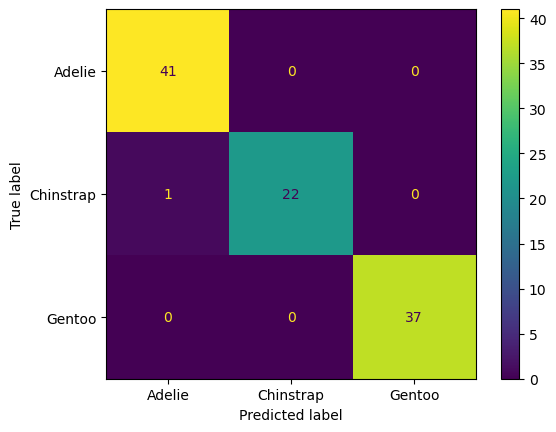

In [23]:
plot_confusion_matrix(rfc,X_test,y_test);

In [24]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

      Adelie       0.98      1.00      0.99        41
   Chinstrap       1.00      0.96      0.98        23
      Gentoo       1.00      1.00      1.00        37

    accuracy                           0.99       101
   macro avg       0.99      0.99      0.99       101
weighted avg       0.99      0.99      0.99       101



In [25]:
df = pd.read_csv('data_banknote_authentication.csv')

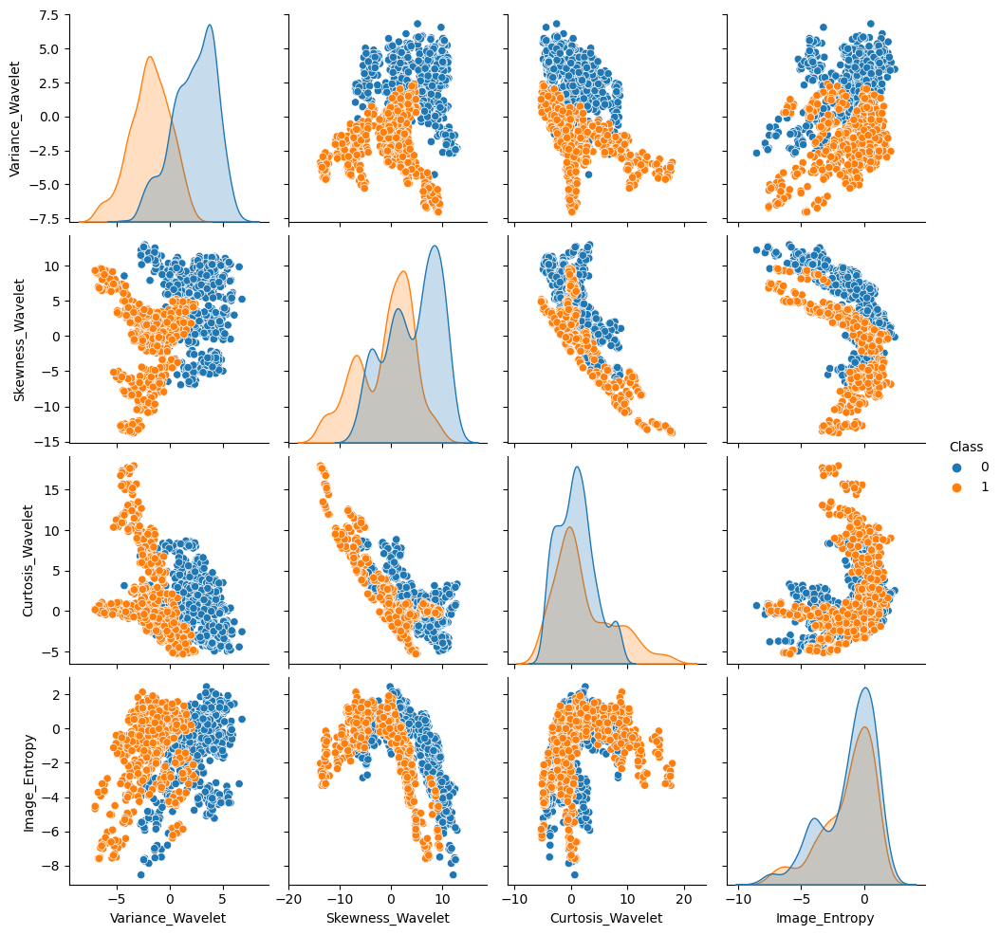

In [29]:
sns.pairplot(df,hue='Class');

In [30]:
X = df.drop('Class', axis=1)

In [31]:
y = df['Class']

In [33]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=101)

In [34]:
from sklearn.model_selection import GridSearchCV

In [35]:
n_estimators = [64, 100, 128, 200]

In [36]:
max_features = [2,3,4]

In [37]:
bootstrap = [True, False]

In [38]:
oob_score = [True, False]

In [39]:
param_grid = {'n_estimators': n_estimators, 
             'max_features': max_features, 
             'bootstrap': bootstrap,
             'oob_score': oob_score}

In [40]:
rfc = RandomForestClassifier()

In [41]:
grid = GridSearchCV(rfc, param_grid)

In [42]:
grid.fit(X_train, y_train)

C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\ensemble\_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  FitFailedWarning)
C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\li

C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\ensemble\_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  FitFailedWarning)
C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\li

C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\ensemble\_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  FitFailedWarning)
C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\li

C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py", line 531, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\ensemble\_forest.py", line 351, in fit
    raise ValueError("Out of bag estimation only available"
ValueError: Out of bag estimation only available if bootstrap=True

  FitFailedWarning)
C:\Users\whati\anaconda3\envs\mll\lib\site-packages\sklearn\model_selection\_validation.py:552: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\whati\anaconda3\envs\mll\li

GridSearchCV(estimator=RandomForestClassifier(),
             param_grid={'bootstrap': [True, False], 'max_features': [2, 3, 4],
                         'n_estimators': [64, 100, 128, 200],
                         'oob_score': [True, False]})

In [43]:
grid.best_params_

{'bootstrap': True, 'max_features': 2, 'n_estimators': 64, 'oob_score': False}

In [44]:
rfc = RandomForestClassifier(max_features=2, n_estimators=64, oob_score=True)

In [45]:
rfc.fit(X_train,y_train)

RandomForestClassifier(max_features=2, n_estimators=64, oob_score=True)

In [46]:
rfc.oob_score_

0.9914236706689536

In [47]:
predictions = rfc.predict(X_test)

In [48]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       124
           1       0.98      1.00      0.99        82

    accuracy                           0.99       206
   macro avg       0.99      0.99      0.99       206
weighted avg       0.99      0.99      0.99       206



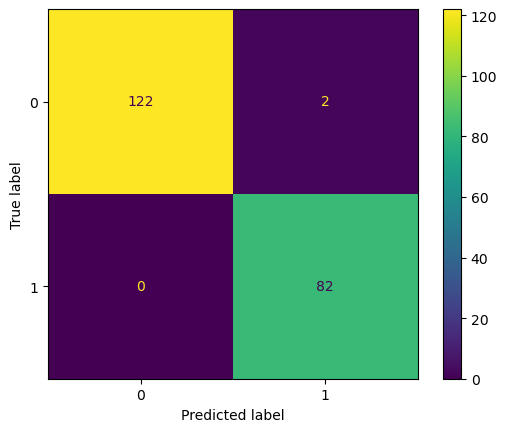

In [50]:
plot_confusion_matrix(rfc, X_test,y_test);

In [51]:
from sklearn.metrics import accuracy_score

In [52]:
errors = []
misclassifications = []

for n in range(1,200):
    rfc = RandomForestClassifier(n_estimators=n, max_features=2)
    rfc.fit(X_train,y_train)
    preds = rfc.predict(X_test)
    err = 1 - accuracy_score(y_test, preds)
    n_missed = np.sum(preds != y_test)
    
    errors.append(err)
    misclassifications.append(n_missed)

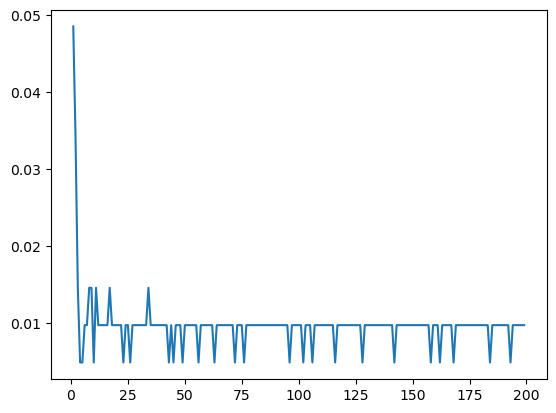

In [53]:
plt.plot(range(1,200), errors);

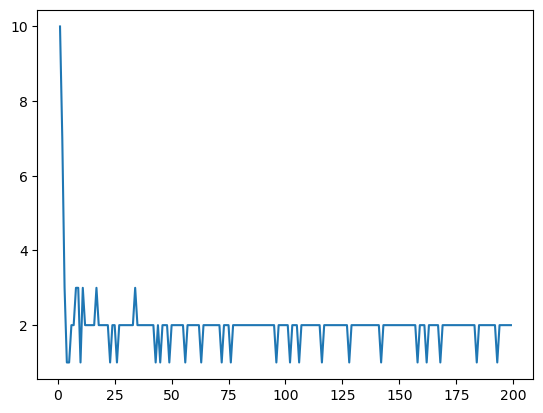

In [54]:
plt.plot(range(1,200), misclassifications);

---

# Выполнение задачи регрессии разными моделями

In [4]:
df = pd.read_csv('rock_density_xray.csv')
df

,Rebound Signal Strength nHz,Rock Density kg/m3
0,72.945124,2.456548
1,14.229877,2.601719
2,36.597334,1.967004
3,9.578899,2.300439
4,21.765897,2.452374
...,...,...
295,0.700227,2.112965
296,58.586585,2.000293
297,54.674548,1.879181
298,15.162434,2.644990


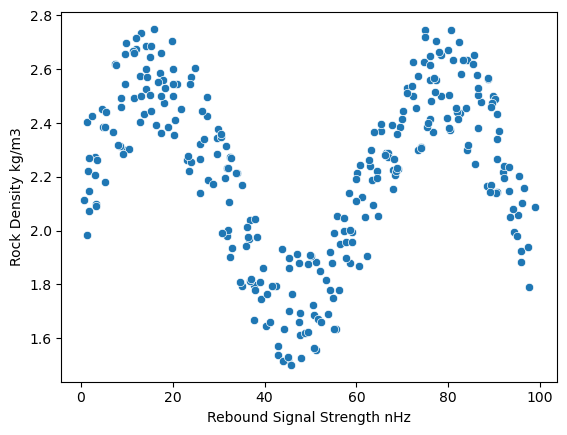

In [5]:
sns.scatterplot(x=df['Rebound Signal Strength nHz'],y=df['Rock Density kg/m3']);

In [6]:
df.columns = ['Signal', 'Density']

In [7]:
X = df['Signal'].values.reshape(-1,1)
y = df['Density']

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.1,random_state=101)

In [9]:
lr_model = LinearRegression()

In [10]:
lr_model.fit(X_train,y_train)

LinearRegression()

In [11]:
lr_preds = lr_model.predict(X_test)

In [12]:
mean_absolute_error(y_test,lr_preds)

0.211198973318633

In [13]:
mean_squared_error(y_test,lr_preds) ** 0.5

0.25700519965846297

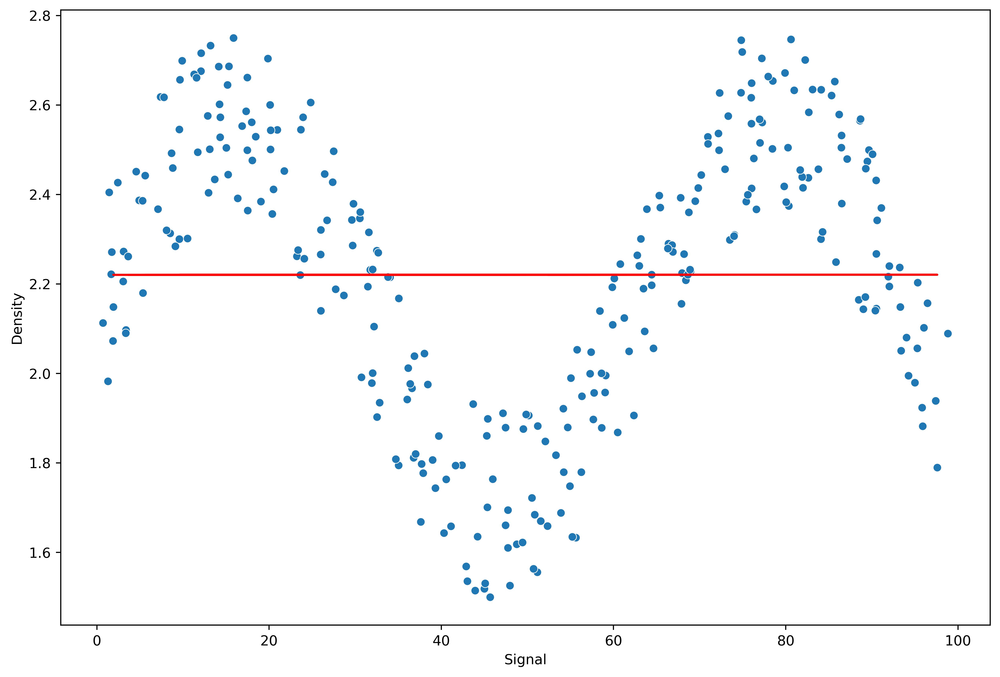

In [14]:
plt.figure(figsize=(12,8),dpi=500)
sns.scatterplot(x=df['Signal'],y=df['Density'])
plt.plot(X_test,lr_preds,'red');

In [15]:
def run_model(model,X_train,y_train,X_test,y_test):
    
    model.fit(X_train,y_train)
    preds = model.predict(X_test)
    rmse = mean_squared_error(y_test,preds) ** 0.5
    print(f'RMSE: {rmse}')
    
    signal_range = np.arange(0,100)
    signal_preds = model.predict(signal_range.reshape(-1,1))
    
    plt.figure(figsize=(12,8),dpi=500)
    sns.scatterplot(x=df['Signal'],y=df['Density'])
    plt.plot(signal_range,signal_preds,'red')

In [16]:
from sklearn.pipeline import make_pipeline

RMSE: 0.13807559069395703


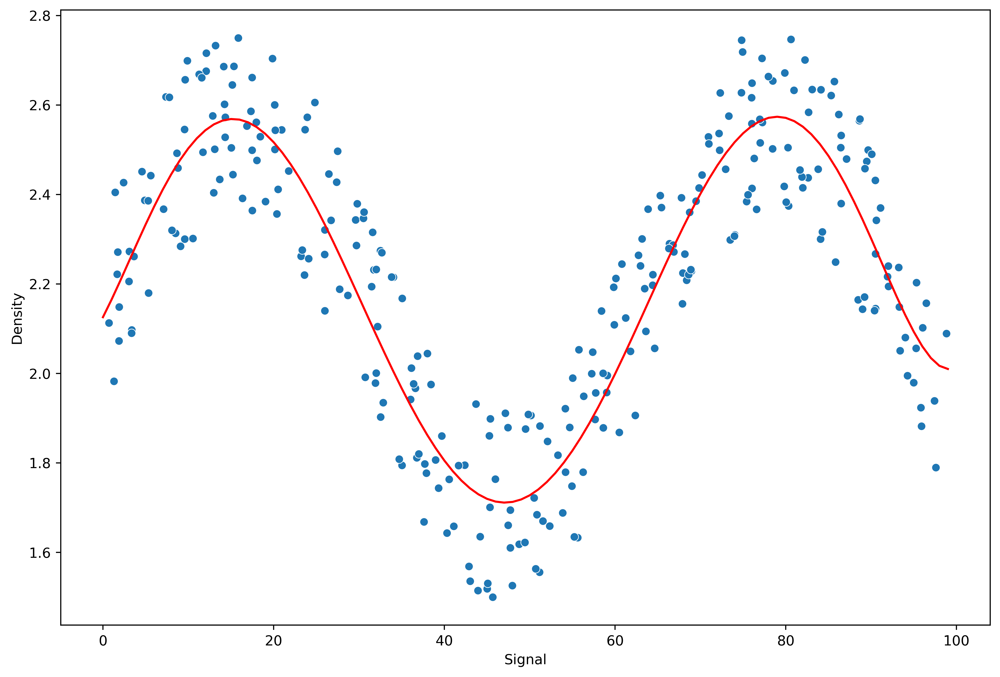

In [17]:
pipe = make_pipeline(PolynomialFeatures(degree=6),LinearRegression())
run_model(pipe,X_train,y_train,X_test,y_test)

RMSE: 0.13277855732740926


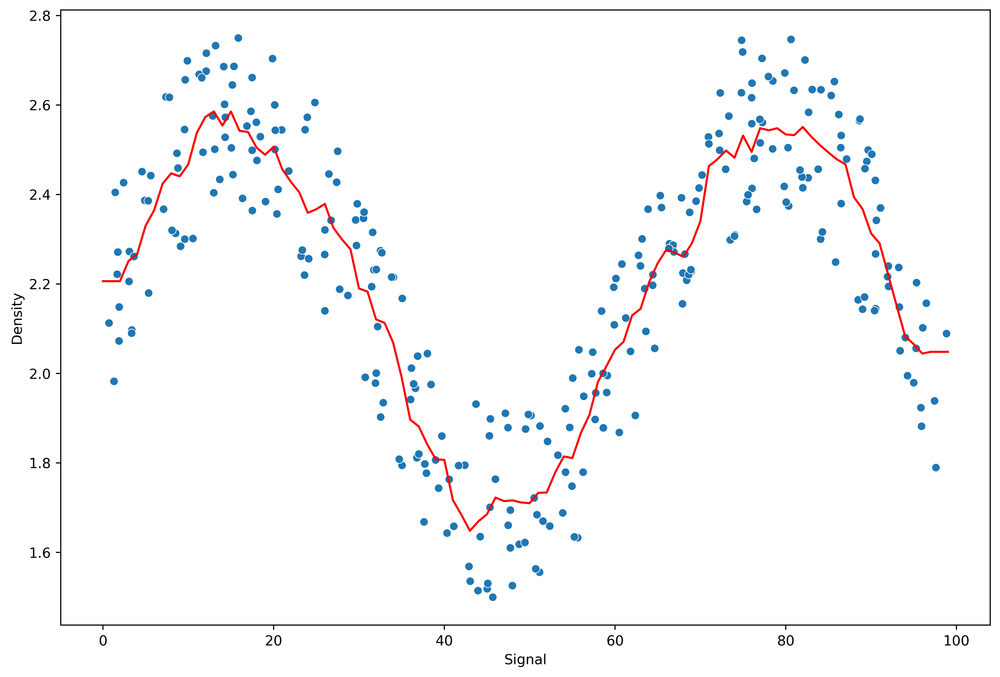

In [28]:
knn = KNeighborsRegressor(n_neighbors=10)
run_model(knn,X_train,y_train,X_test,y_test)

RMSE: 0.1349835870961835


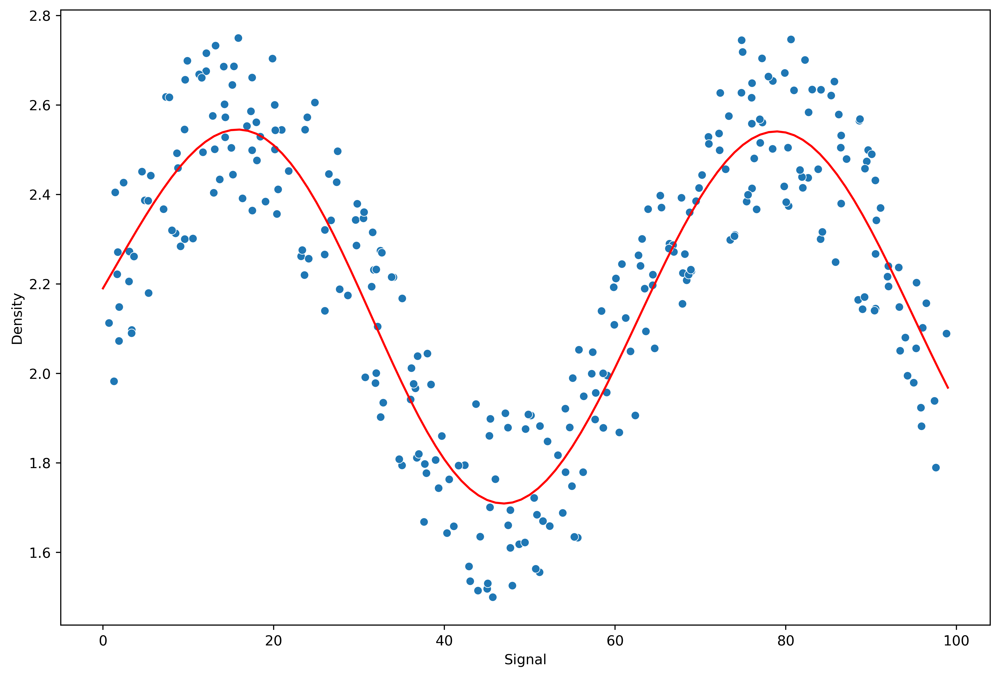

In [29]:
svm = SVR()
run_model(svm,X_train,y_train,X_test,y_test)

RMSE: 0.15234870286353372


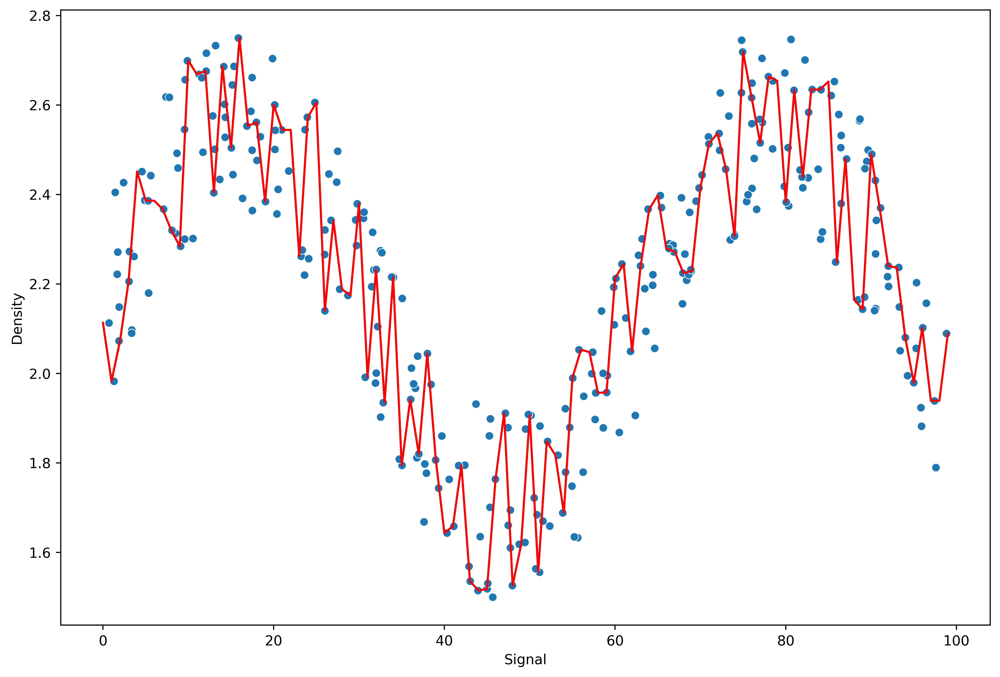

In [30]:
dt = DecisionTreeRegressor()
run_model(dt,X_train,y_train,X_test,y_test)

RMSE: 0.14431709753193303


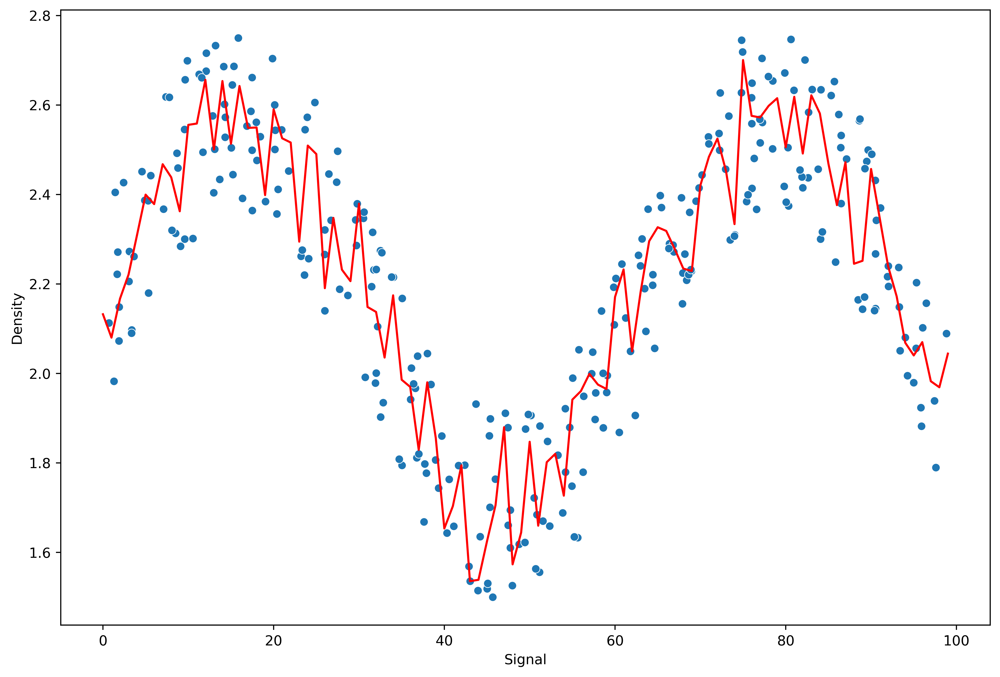

In [31]:
rf = RandomForestRegressor(n_estimators=10)
run_model(rf,X_train,y_train,X_test,y_test)

In [33]:
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor

RMSE: 0.13294148649584667


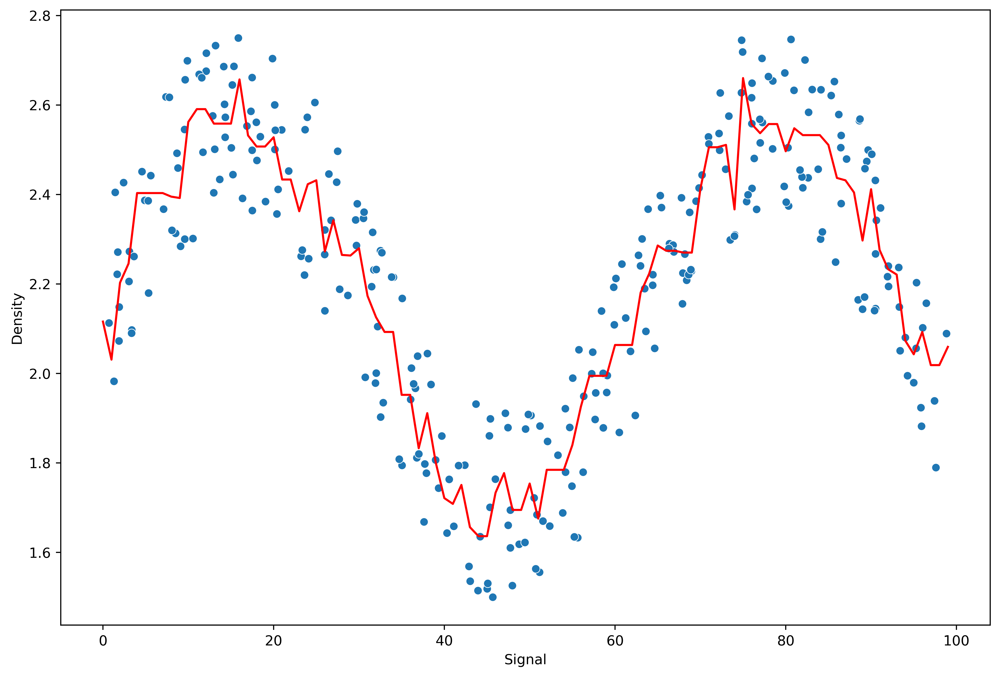

In [32]:
gb = GradientBoostingRegressor()
run_model(gb,X_train,y_train,X_test,y_test)

RMSE: 0.1352764366686805


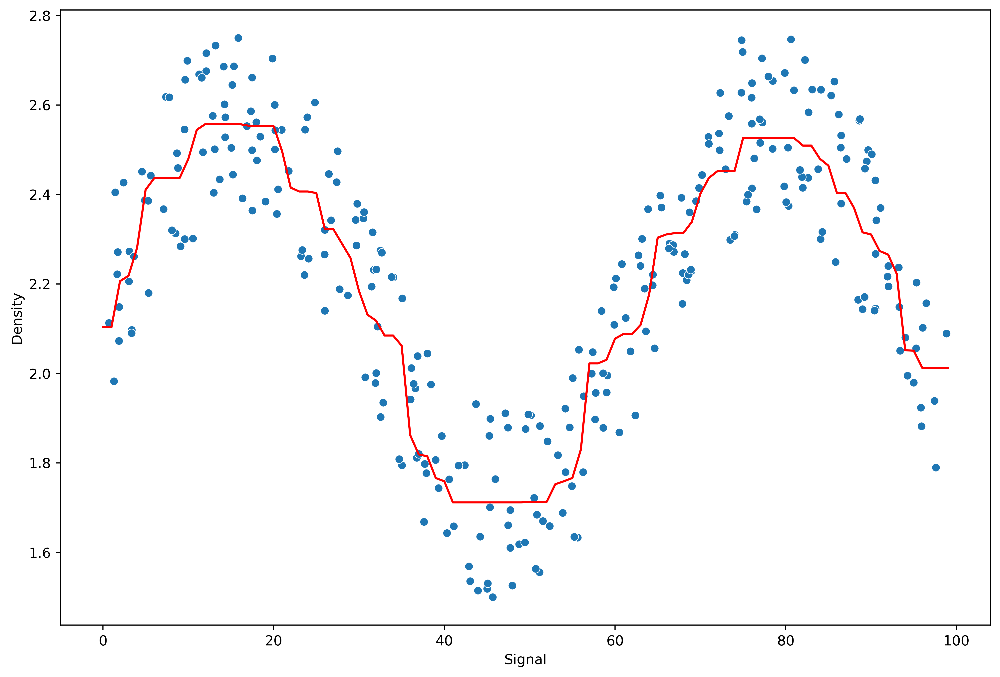

In [34]:
ab = AdaBoostRegressor()
run_model(ab,X_train,y_train,X_test,y_test)

# Бустинг

In [36]:
df = pd.read_csv('mushrooms.csv')
df.transpose()

,0,1,2,3,4,5,6,7,8,9,...,8114,8115,8116,8117,8118,8119,8120,8121,8122,8123
class,p,e,e,p,e,e,e,e,p,e,...,p,e,p,p,p,e,e,e,p,e
cap-shape,x,x,b,x,x,x,b,b,x,b,...,f,x,k,k,k,k,x,f,k,x
cap-surface,s,s,s,y,s,y,s,y,y,s,...,y,s,y,s,y,s,s,s,y,s
cap-color,n,y,w,w,g,y,w,w,w,y,...,c,n,n,e,n,n,n,n,n,n
bruises,t,t,t,t,f,t,t,t,t,t,...,f,f,f,f,f,f,f,f,f,f
odor,p,a,l,p,n,a,a,l,p,a,...,m,n,s,y,f,n,n,n,y,n
gill-attachment,f,f,f,f,f,f,f,f,f,f,...,a,a,f,f,f,a,a,a,f,a
gill-spacing,c,c,c,c,w,c,c,c,c,c,...,c,c,c,c,c,c,c,c,c,c
gill-size,n,b,b,n,b,b,b,b,n,b,...,b,b,n,n,n,b,b,b,n,b
gill-color,k,k,n,n,k,n,g,n,p,g,...,y,y,b,b,b,y,y,n,b,y


In [38]:
df['class'].value_counts()

e    4208
p    3916
Name: class, dtype: int64

In [42]:
df.describe().transpose()

,count,unique,top,freq
class,8124,2,e,4208
cap-shape,8124,6,x,3656
cap-surface,8124,4,y,3244
cap-color,8124,10,n,2284
bruises,8124,2,f,4748
odor,8124,9,n,3528
gill-attachment,8124,2,f,7914
gill-spacing,8124,2,c,6812
gill-size,8124,2,b,5612
gill-color,8124,12,b,1728


In [43]:
X = df.drop('class',axis=1)
X = pd.get_dummies(X,drop_first=True)
y = df['class']

In [44]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.15,random_state=101)

In [45]:
from sklearn.ensemble import AdaBoostClassifier

In [46]:
model = AdaBoostClassifier(n_estimators=1)

In [47]:
model.fit(X_train,y_train)

AdaBoostClassifier(n_estimators=1)

In [49]:
preds = model.predict(X_test)

In [50]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           e       0.96      0.81      0.88       655
           p       0.81      0.96      0.88       564

    accuracy                           0.88      1219
   macro avg       0.88      0.88      0.88      1219
weighted avg       0.89      0.88      0.88      1219



In [58]:
model.feature_importances_

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [60]:
X.columns[22]

'odor_n'

In [62]:
df['odor'].unique()

array(['p', 'a', 'l', 'n', 'f', 'c', 'y', 's', 'm'], dtype=object)

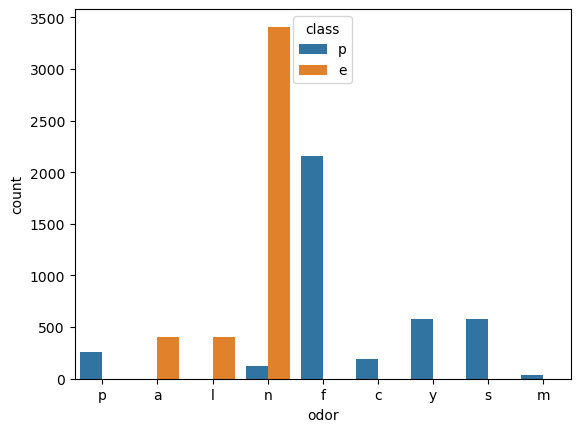

In [78]:
sns.countplot(data=df,x='odor',hue='class');

In [63]:
error_rates = []

for n in range(1,96):
    model = AdaBoostClassifier(n_estimators=n)
    model.fit(X_train,y_train)
    preds = model.predict(X_test)
    
    err = 1 - accuracy_score(y_test,preds)
    error_rates.append(err)

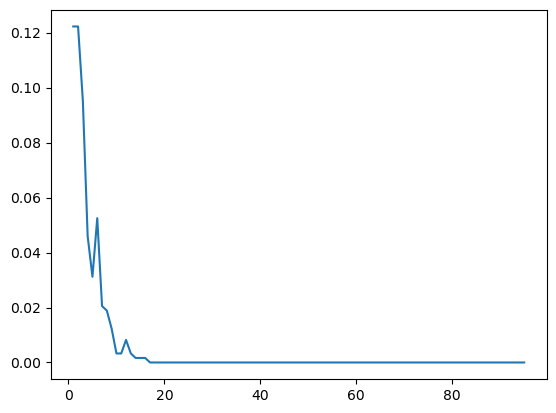

In [66]:
plt.plot(range(1,96),error_rates);

In [73]:
feats = pd.DataFrame(index=X.columns,data=model.feature_importances_,columns=['importance'])
feats.sort_values('importance',ascending=False).head(10)

,importance
spore-print-color_w,0.168421
population_c,0.105263
gill-spacing_w,0.094737
gill-size_n,0.094737
stalk-color-below-ring_n,0.063158
stalk-surface-above-ring_k,0.063158
odor_n,0.063158
spore-print-color_r,0.052632
bruises_t,0.052632
population_v,0.042105


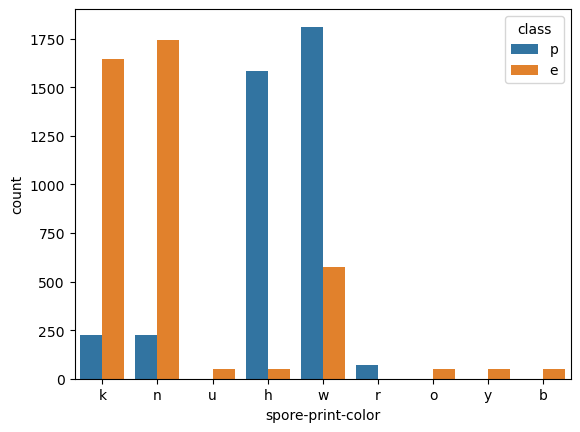

In [77]:
sns.countplot(data=df,x='spore-print-color',hue='class');

---

In [79]:
from sklearn.ensemble import GradientBoostingClassifier

In [80]:
model = GradientBoostingClassifier()

In [81]:
param_grid = {'n_estimators':[10,50,100],
             'learning_rate':[0.1,0.05,0,2],
             'max_depth':[3,4,5]}

In [83]:
grid = GridSearchCV(model,param_grid,n_jobs=-1,verbose=10)

In [84]:
grid.fit(X_train,y_train)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done  18 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done  29 tasks      | elapsed:    6.3s
[Parallel(n_jobs=-1)]: Done  40 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done  53 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done  66 tasks      | elapsed:   10.1s
[Parallel(n_jobs=-1)]: Done  81 tasks      | elapsed:   10.6s
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:   11.0s
[Parallel(n_jobs=-1)]: Done 113 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   12.2s
[Parallel(n_jobs=-1)]: Done 149 tasks      | elapsed:   13.8s
[Parallel(n_jobs=-1)]: Done 168 out of 180 | elapsed:   16.1s remaining:    1.1s
[Parallel(n_jobs=-1)]: Done 180 out of 180 | elapsed:   17.2s finished


GridSearchCV(estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.05, 0, 2],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [10, 50, 100]},
             verbose=10)

In [87]:
grid.best_params_

{'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}

In [85]:
print(classification_report(y_test,grid.predict(X_test)))

              precision    recall  f1-score   support

           e       1.00      1.00      1.00       655
           p       1.00      1.00      1.00       564

    accuracy                           1.00      1219
   macro avg       1.00      1.00      1.00      1219
weighted avg       1.00      1.00      1.00      1219



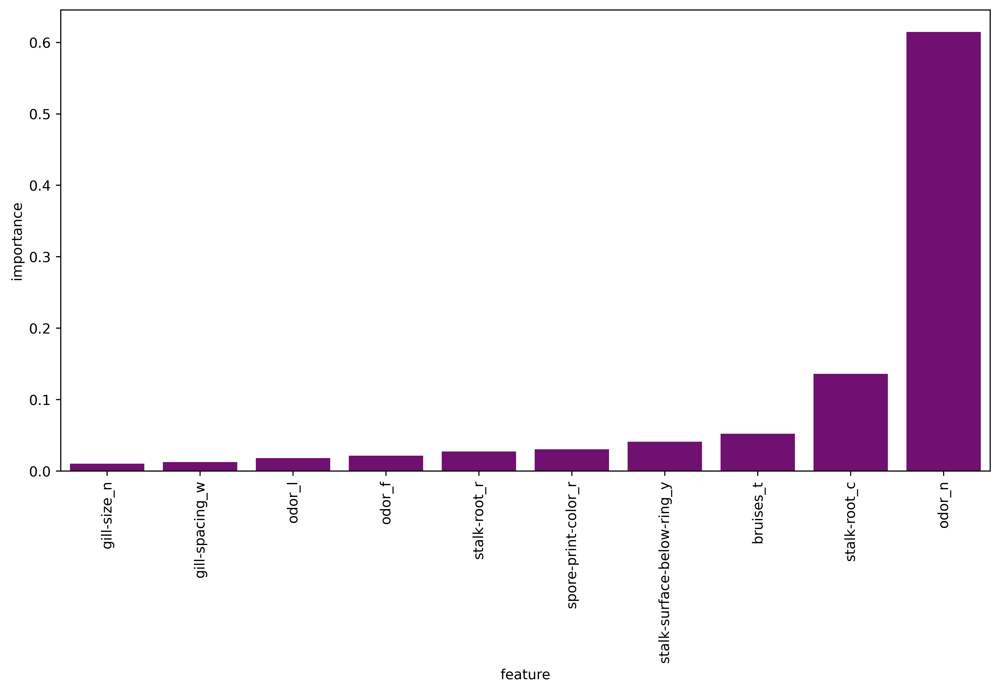

In [99]:
f = pd.DataFrame({'feature':X.columns,'importance':grid.best_estimator_.feature_importances_}).sort_values('importance').tail(10)
plt.figure(figsize=(12,6),dpi=500)
sns.barplot(data=f,x='feature',y='importance',color='purple')
plt.xticks(rotation=90);

---

# K-Means Clustering

In [4]:
df = pd.read_csv('bank-full.csv')
df.transpose()

,0,1,2,3,4,5,6,7,8,9,...,41178,41179,41180,41181,41182,41183,41184,41185,41186,41187
age,56,57,37,40,56,45,59,41,24,25,...,62,64,36,37,29,73,46,56,44,74
job,housemaid,services,services,admin.,services,services,admin.,blue-collar,technician,services,...,retired,retired,admin.,admin.,unemployed,retired,blue-collar,retired,technician,retired
marital,married,married,married,married,married,married,married,married,single,single,...,married,divorced,married,married,single,married,married,married,married,married
education,basic.4y,high.school,high.school,basic.6y,high.school,basic.9y,professional.course,unknown,professional.course,high.school,...,university.degree,professional.course,university.degree,university.degree,basic.4y,professional.course,professional.course,university.degree,professional.course,professional.course
default,no,unknown,no,no,no,unknown,no,unknown,no,no,...,no,no,no,no,no,no,no,no,no,no
housing,no,no,yes,no,no,no,no,no,yes,yes,...,no,yes,no,yes,yes,yes,no,yes,no,yes
loan,no,no,no,no,yes,no,no,no,no,no,...,no,no,no,no,no,no,no,no,no,no
contact,telephone,telephone,telephone,telephone,telephone,telephone,telephone,telephone,telephone,telephone,...,cellular,cellular,cellular,cellular,cellular,cellular,cellular,cellular,cellular,cellular
month,may,may,may,may,may,may,may,may,may,may,...,nov,nov,nov,nov,nov,nov,nov,nov,nov,nov
day_of_week,mon,mon,mon,mon,mon,mon,mon,mon,mon,mon,...,thu,fri,fri,fri,fri,fri,fri,fri,fri,fri


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 41188 entries, 0 to 41187
Data columns (total 21 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   age             41188 non-null  int64  
 1   job             41188 non-null  object 
 2   marital         41188 non-null  object 
 3   education       41188 non-null  object 
 4   default         41188 non-null  object 
 5   housing         41188 non-null  object 
 6   loan            41188 non-null  object 
 7   contact         41188 non-null  object 
 8   month           41188 non-null  object 
 9   day_of_week     41188 non-null  object 
 10  duration        41188 non-null  int64  
 11  campaign        41188 non-null  int64  
 12  pdays           41188 non-null  int64  
 13  previous        41188 non-null  int64  
 14  poutcome        41188 non-null  object 
 15  emp.var.rate    41188 non-null  float64
 16  cons.price.idx  41188 non-null  float64
 17  cons.conf.idx   41188 non-null 

In [6]:
df.describe()

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed
count,41188.00000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000,41188.000000
mean,40.02406,258.285010,2.567593,962.475454,0.172963,0.081886,93.575664,-40.502600,3.621291,5167.035911
std,10.42125,259.279249,2.770014,186.910907,0.494901,1.570960,0.578840,4.628198,1.734447,72.251528
min,17.00000,0.000000,1.000000,0.000000,0.000000,-3.400000,92.201000,-50.800000,0.634000,4963.600000
25%,32.00000,102.000000,1.000000,999.000000,0.000000,-1.800000,93.075000,-42.700000,1.344000,5099.100000
50%,38.00000,180.000000,2.000000,999.000000,0.000000,1.100000,93.749000,-41.800000,4.857000,5191.000000
75%,47.00000,319.000000,3.000000,999.000000,0.000000,1.400000,93.994000,-36.400000,4.961000,5228.100000
max,98.00000,4918.000000,56.000000,999.000000,7.000000,1.400000,94.767000,-26.900000,5.045000,5228.100000


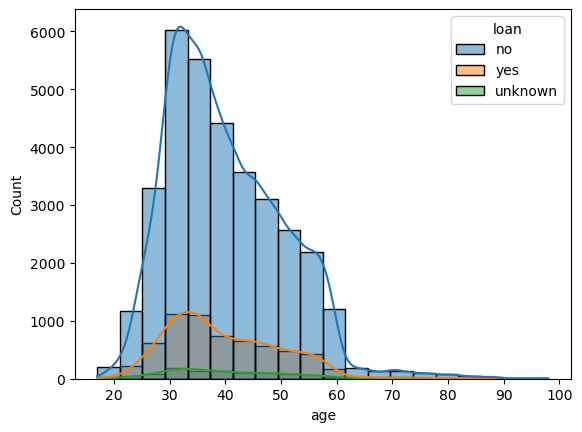

In [28]:
sns.histplot(data=df,x='age',bins=20,kde=True,hue='loan');

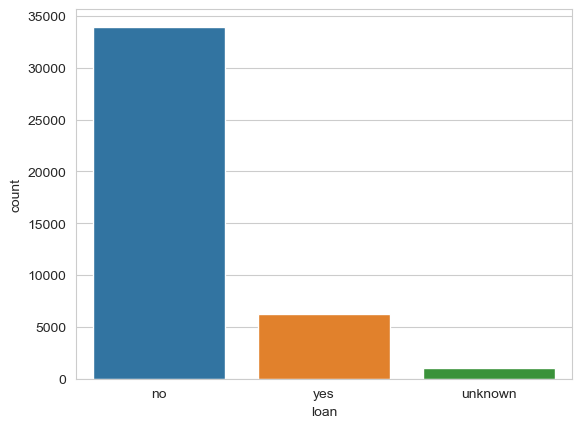

In [30]:
sns.set_style('whitegrid')
sns.countplot(data=df,x='loan');

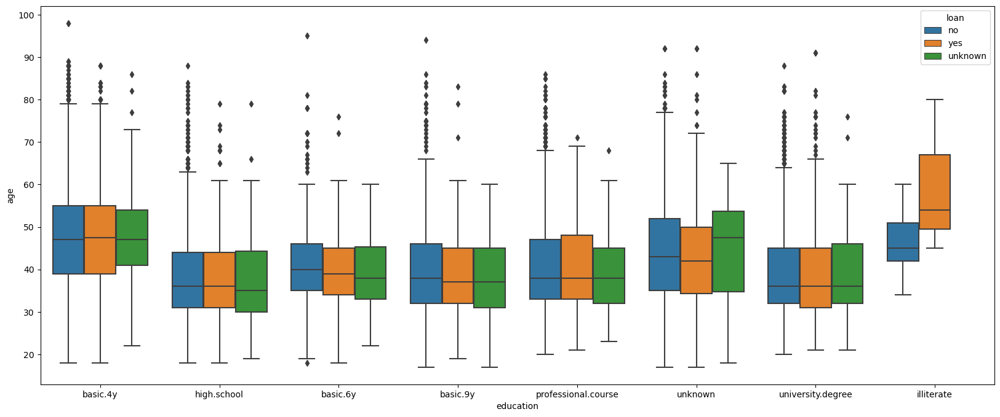

In [19]:
plt.figure(figsize=(20,8))
sns.boxplot(data=df,x='education',y='age',hue='loan');

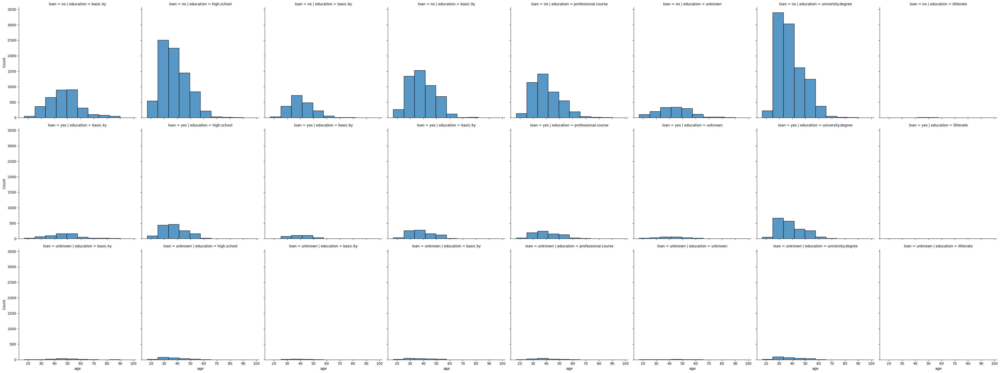

In [26]:
sns.displot(data=df,col='education',x='age',row='loan',bins=10);

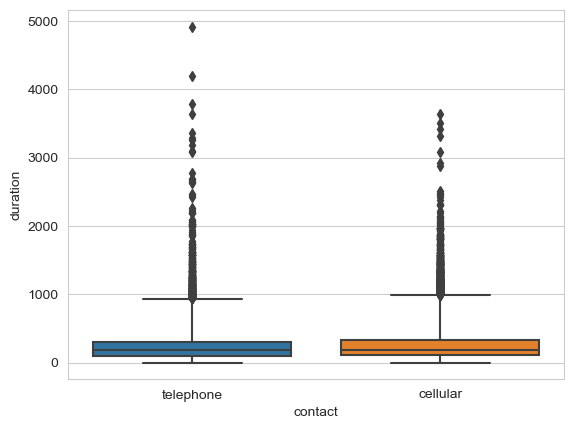

In [33]:
sns.boxplot(data=df,x='contact',y='duration',whis=3);

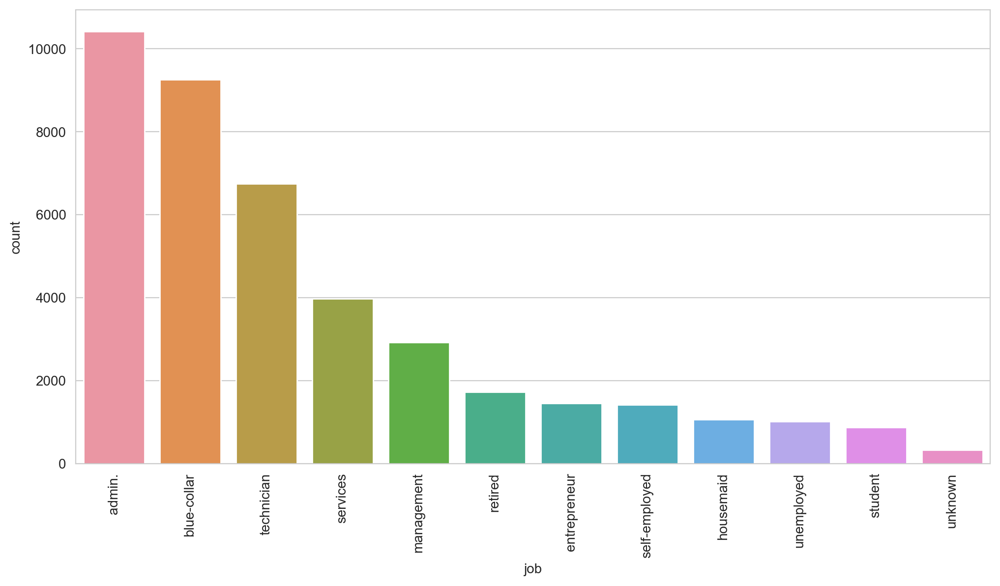

In [34]:
plt.figure(figsize=(12,6),dpi=200)
sns.countplot(data=df,x='job',order=df['job'].value_counts().index)
plt.xticks(rotation=90);

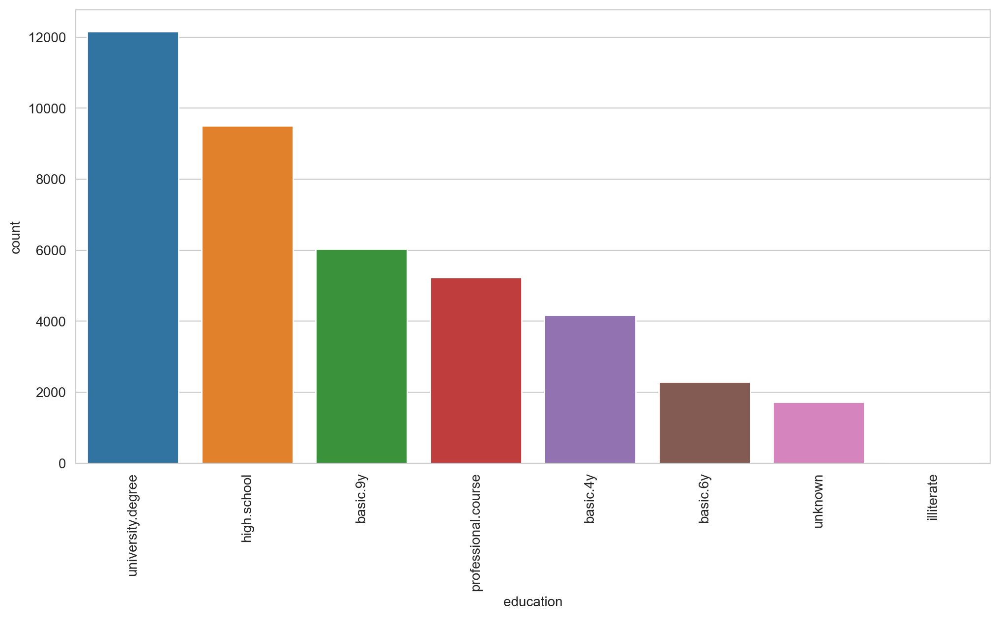

In [35]:
plt.figure(figsize=(12,6),dpi=200)
sns.countplot(data=df,x='education',order=df['education'].value_counts().index)
plt.xticks(rotation=90);

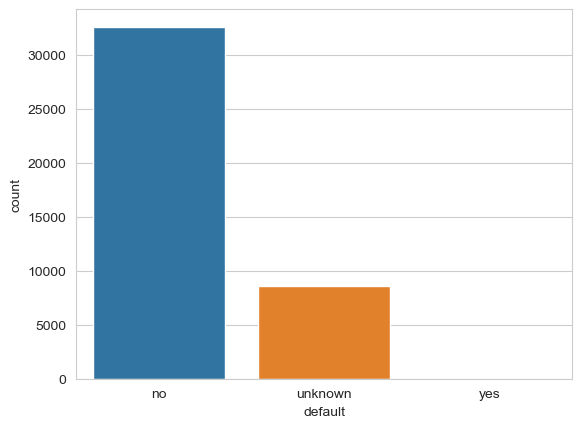

In [36]:
sns.countplot(data=df,x='default');

In [37]:
df['default'].value_counts()

no         32588
unknown     8597
yes            3
Name: default, dtype: int64

---

In [39]:
X = pd.get_dummies(df)
X

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_fri,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,subscribed_no,subscribed_yes
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,0,1
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,1,0
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,1,0
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,1,0,0,0,0,0,1,0,0,1


In [40]:
scaler = StandardScaler()
scaled_X = scaler.fit_transform(X)

In [42]:
from sklearn.cluster import KMeans

In [43]:
model = KMeans(n_clusters=2)

In [44]:
cluster_labels = model.fit_predict(scaled_X)
cluster_labels

array([0, 0, 0, ..., 1, 1, 1])

In [45]:
X['Cluster'] = cluster_labels

In [46]:
X

,age,duration,campaign,pdays,previous,emp.var.rate,cons.price.idx,cons.conf.idx,euribor3m,nr.employed,...,day_of_week_mon,day_of_week_thu,day_of_week_tue,day_of_week_wed,poutcome_failure,poutcome_nonexistent,poutcome_success,subscribed_no,subscribed_yes,Cluster
0,56,261,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,0,0,0,0,1,0,1,0,0
1,57,149,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,0,0,0,0,1,0,1,0,0
2,37,226,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,0,0,0,0,1,0,1,0,0
3,40,151,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,0,0,0,0,1,0,1,0,0
4,56,307,1,999,0,1.1,93.994,-36.4,4.857,5191.0,...,1,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41183,73,334,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,0,0,0,1,0,0,1,1
41184,46,383,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,0,0,0,1,0,1,0,1
41185,56,189,2,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,0,0,0,1,0,1,0,1
41186,44,442,1,999,0,-1.1,94.767,-50.8,1.028,4963.6,...,0,0,0,0,0,1,0,0,1,1


In [49]:
X.corr()['Cluster'].sort_values()[:-1]

euribor3m              -0.959234
emp.var.rate           -0.932594
nr.employed            -0.886085
cons.price.idx         -0.679416
poutcome_nonexistent   -0.544318
                          ...   
subscribed_yes          0.294887
month_apr               0.357885
contact_cellular        0.410540
poutcome_failure        0.464246
previous                0.478416
Name: Cluster, Length: 65, dtype: float64

In [50]:
ssd = []

for k in range(2,11):
    model = KMeans(n_clusters=k)
    model.fit(scaled_X)
    
    ssd.append(model.inertia_)

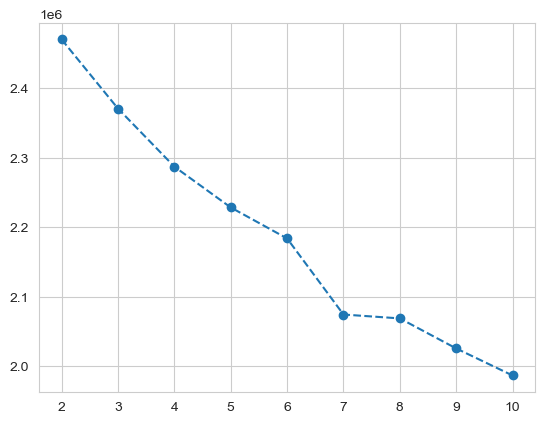

In [51]:
plt.plot(range(2,11),ssd,'o--');

In [53]:
pd.Series(ssd).diff()

0              NaN
1    -99376.231276
2    -83478.750906
3    -58647.324678
4    -44567.136162
5   -109384.942508
6     -5584.650927
7    -43169.221287
8    -38889.373402
dtype: float64

In [54]:
from sklearn.metrics import silhouette_score

In [55]:
silhouettes = []

for k in range(2,11):
    model = KMeans(n_clusters=k)
    model.fit(scaled_X)
    
    silhouettes.append(silhouette_score(scaled_X,model.labels_))

In [56]:
silhouettes

[0.11700113001983012,
 0.04432673589060626,
 0.05864897822354072,
 0.07131752469357805,
 0.06677184158243349,
 0.0716759577213838,
 0.06816013662826932,
 0.06873740439467003,
 0.0706027842330201]

### Квантование цветов

In [57]:
import matplotlib.image as mpimg

In [59]:
img_as_array = mpimg.imread('palm_trees.jpg')

In [60]:
img_as_array.shape

(1401, 934, 3)

In [61]:
img_as_array

array([[[ 25,  89, 127],
        [ 25,  89, 127],
        [ 25,  89, 127],
        ...,
        [ 23,  63,  99],
        [ 51,  91, 127],
        [ 50,  90, 126]],

       [[ 25,  89, 127],
        [ 25,  89, 127],
        [ 25,  89, 127],
        ...,
        [ 31,  71, 107],
        [ 48,  88, 124],
        [ 47,  90, 125]],

       [[ 25,  89, 127],
        [ 25,  89, 127],
        [ 25,  89, 127],
        ...,
        [ 39,  79, 115],
        [ 42,  85, 120],
        [ 44,  88, 123]],

       ...,

       [[  4,   4,   6],
        [  4,   4,   6],
        [  4,   4,   6],
        ...,
        [  9,   9,  11],
        [  9,   9,  11],
        [  9,   9,  11]],

       [[  3,   3,   5],
        [  3,   3,   5],
        [  3,   3,   5],
        ...,
        [  8,   8,  10],
        [  8,   8,  10],
        [  8,   8,  10]],

       [[  4,   4,   6],
        [  4,   4,   6],
        [  4,   4,   6],
        ...,
        [  9,   9,  11],
        [ 10,  10,  12],
        [ 10,  10,  12]]

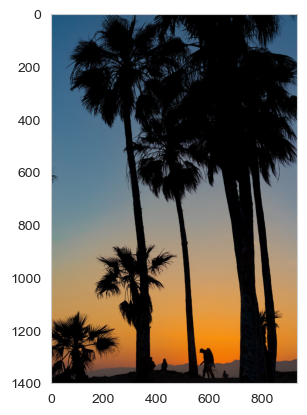

In [63]:
plt.imshow(img_as_array)
plt.grid(False)

In [64]:
(h,w,c) = img_as_array.shape

In [65]:
img_as_array2d = img_as_array.reshape(h*w,c)

In [66]:
img_as_array2d

array([[ 25,  89, 127],
       [ 25,  89, 127],
       [ 25,  89, 127],
       ...,
       [  9,   9,  11],
       [ 10,  10,  12],
       [ 10,  10,  12]], dtype=uint8)

In [67]:
model = KMeans(n_clusters=6)

In [68]:
labels = model.fit_predict(img_as_array2d)

In [72]:
labels

array([5, 5, 5, ..., 1, 1, 1])

In [71]:
rgb_codes = model.cluster_centers_.round(0).astype(int)
rgb_codes

array([[193, 155, 108],
       [  3,   3,   4],
       [139, 144, 143],
       [ 68,  62,  63],
       [219, 135,  46],
       [ 72, 110, 138]])

In [74]:
quantized_image = np.reshape(rgb_codes[labels],(h,w,c))

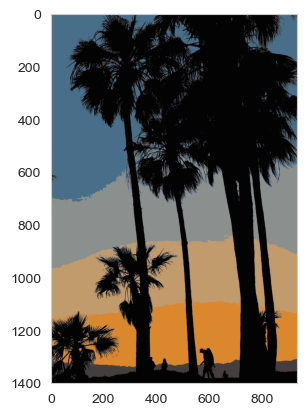

In [76]:
plt.imshow(quantized_image)
plt.grid(False);

# Иерархическая кластеризация

In [3]:
df = pd.read_csv('cluster_mpg.csv')
df

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino
...,...,...,...,...,...,...,...,...,...
387,27.0,4,140.0,86.0,2790,15.6,82,usa,ford mustang gl
388,44.0,4,97.0,52.0,2130,24.6,82,europe,vw pickup
389,32.0,4,135.0,84.0,2295,11.6,82,usa,dodge rampage
390,28.0,4,120.0,79.0,2625,18.6,82,usa,ford ranger


In [4]:
df.describe()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year
count,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000,392.000000
mean,23.445918,5.471939,194.411990,104.469388,2977.584184,15.541327,75.979592
std,7.805007,1.705783,104.644004,38.491160,849.402560,2.758864,3.683737
min,9.000000,3.000000,68.000000,46.000000,1613.000000,8.000000,70.000000
25%,17.000000,4.000000,105.000000,75.000000,2225.250000,13.775000,73.000000
50%,22.750000,4.000000,151.000000,93.500000,2803.500000,15.500000,76.000000
75%,29.000000,8.000000,275.750000,126.000000,3614.750000,17.025000,79.000000
max,46.600000,8.000000,455.000000,230.000000,5140.000000,24.800000,82.000000


In [5]:
ddf = pd.get_dummies(df.drop('name',axis=1))

In [6]:
ddf.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin_europe,origin_japan,origin_usa
0,18.0,8,307.0,130.0,3504,12.0,70,0,0,1
1,15.0,8,350.0,165.0,3693,11.5,70,0,0,1
2,18.0,8,318.0,150.0,3436,11.0,70,0,0,1
3,16.0,8,304.0,150.0,3433,12.0,70,0,0,1
4,17.0,8,302.0,140.0,3449,10.5,70,0,0,1


In [7]:
from sklearn.preprocessing import MinMaxScaler

In [8]:
scaler = MinMaxScaler()

In [9]:
scaled_ddf = scaler.fit_transform(ddf)

In [10]:
scaled_ddf

array([[0.2393617 , 1.        , 0.61757106, ..., 0.        , 0.        ,
        1.        ],
       [0.15957447, 1.        , 0.72868217, ..., 0.        , 0.        ,
        1.        ],
       [0.2393617 , 1.        , 0.64599483, ..., 0.        , 0.        ,
        1.        ],
       ...,
       [0.61170213, 0.2       , 0.17312661, ..., 0.        , 0.        ,
        1.        ],
       [0.50531915, 0.2       , 0.13436693, ..., 0.        , 0.        ,
        1.        ],
       [0.58510638, 0.2       , 0.13178295, ..., 0.        , 0.        ,
        1.        ]])

In [12]:
scaled_ddff = pd.DataFrame(scaled_ddf,columns=ddf.columns)
scaled_ddff

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin_europe,origin_japan,origin_usa
0,0.239362,1.0,0.617571,0.456522,0.536150,0.238095,0.0,0.0,0.0,1.0
1,0.159574,1.0,0.728682,0.646739,0.589736,0.208333,0.0,0.0,0.0,1.0
2,0.239362,1.0,0.645995,0.565217,0.516870,0.178571,0.0,0.0,0.0,1.0
3,0.186170,1.0,0.609819,0.565217,0.516019,0.238095,0.0,0.0,0.0,1.0
4,0.212766,1.0,0.604651,0.510870,0.520556,0.148810,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
387,0.478723,0.2,0.186047,0.217391,0.333711,0.452381,1.0,0.0,0.0,1.0
388,0.930851,0.2,0.074935,0.032609,0.146583,0.988095,1.0,1.0,0.0,0.0
389,0.611702,0.2,0.173127,0.206522,0.193365,0.214286,1.0,0.0,0.0,1.0
390,0.505319,0.2,0.134367,0.179348,0.286929,0.630952,1.0,0.0,0.0,1.0


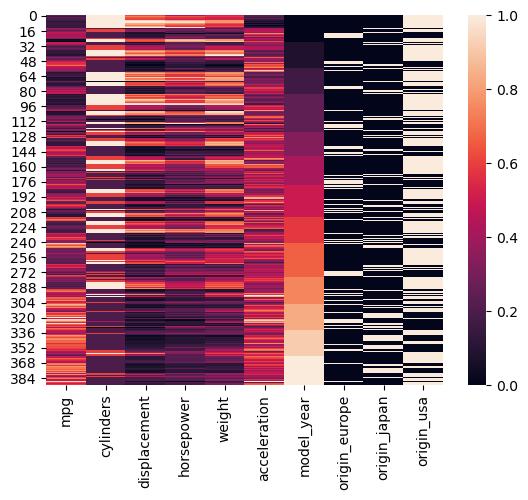

In [14]:
sns.heatmap(scaled_ddff);

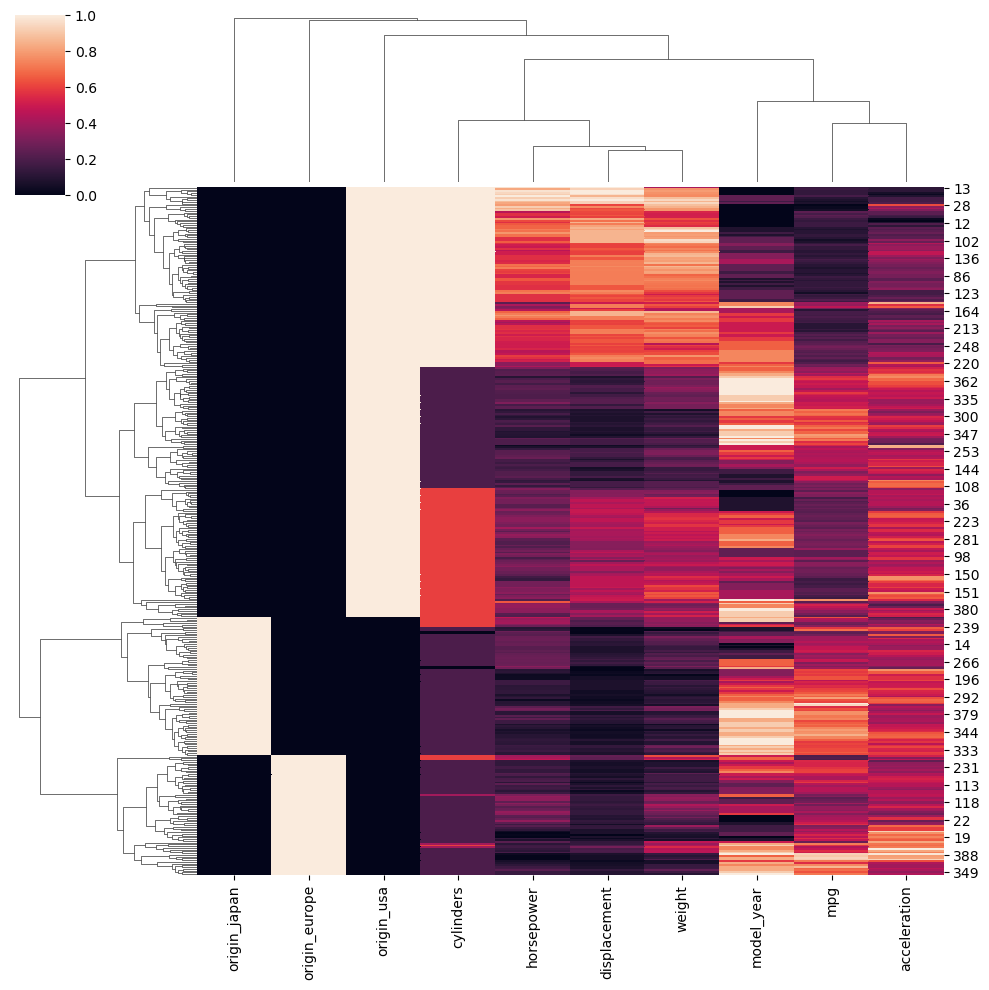

In [15]:
sns.clustermap(scaled_ddff);

In [16]:
from sklearn.cluster import AgglomerativeClustering

In [25]:
model = AgglomerativeClustering(n_clusters=3)

In [26]:
cluster_labels = model.fit_predict(scaled_ddff)

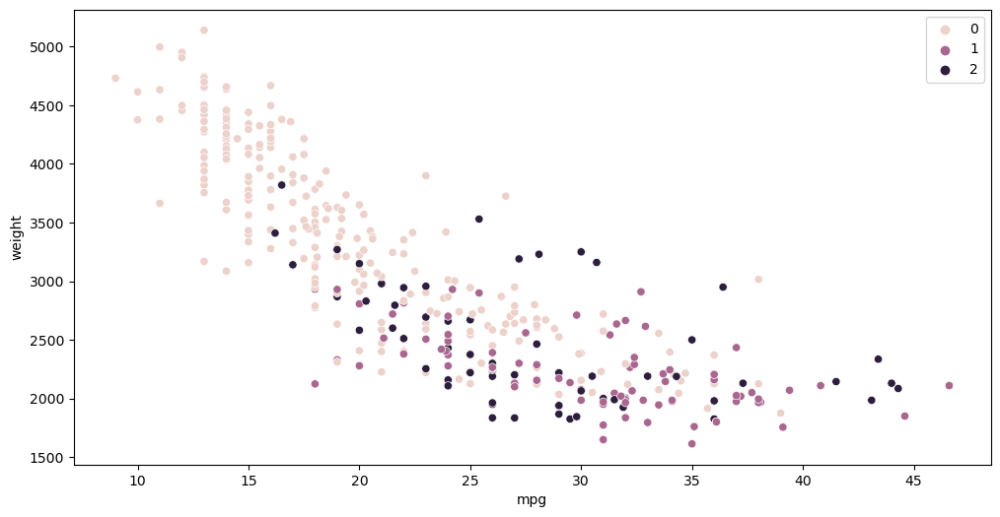

In [27]:
plt.figure(figsize=(12,6))
sns.scatterplot(data=df,x='mpg',y='weight',hue=cluster_labels);

In [28]:
model = AgglomerativeClustering(n_clusters=None,distance_threshold=0)

In [29]:
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster import hierarchy

In [30]:
linkage_matrix = hierarchy.linkage(scaled_ddff.values,method='ward')

In [32]:
np.set_printoptions(suppress=True)

In [33]:
linkage_matrix

array([[ 67.        ,  68.        ,   0.0401977 ,   2.        ],
       [232.        , 234.        ,   0.0412867 ,   2.        ],
       [ 63.        ,  74.        ,   0.04316861,   2.        ],
       ...,
       [778.        , 779.        ,  10.74105893, 245.        ],
       [775.        , 777.        ,  12.18934549, 147.        ],
       [780.        , 781.        ,  19.30749251, 392.        ]])

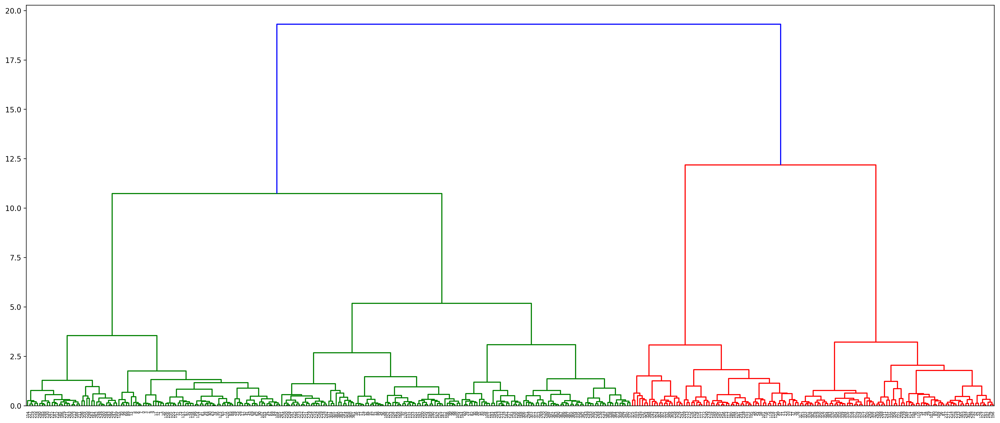

In [36]:
plt.figure(figsize=(24,10),dpi=200)
dendro = dendrogram(linkage_matrix)

# DBSCAN

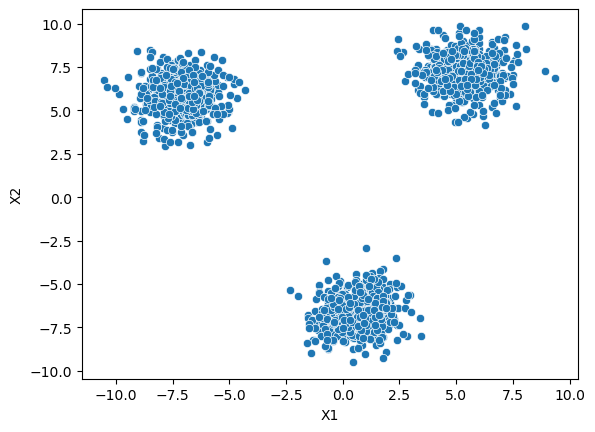

In [5]:
blobs = pd.read_csv('cluster_blobs.csv')
sns.scatterplot(data=blobs,x='X1',y='X2');

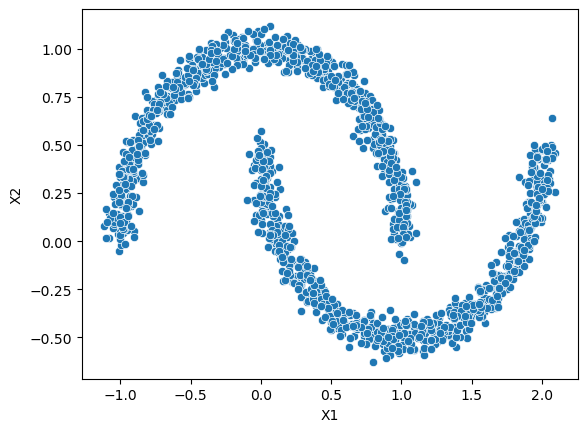

In [6]:
moons = pd.read_csv('cluster_moons.csv')
sns.scatterplot(data=moons,x='X1',y='X2');

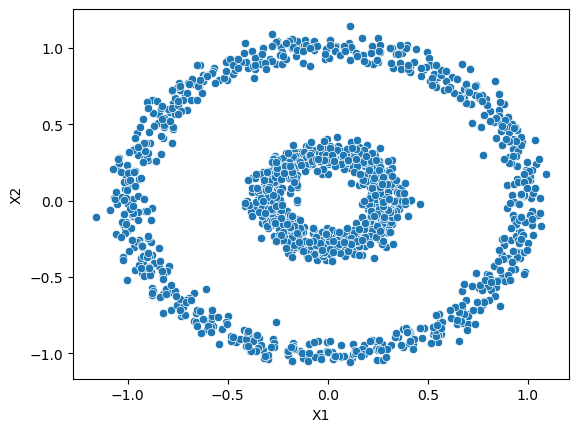

In [7]:
circles = pd.read_csv('cluster_circles.csv')
sns.scatterplot(data=circles,x='X1',y='X2');

In [8]:
def display_categories(model,data):
    labels = model.fit_predict(data)
    sns.scatterplot(data=data,x='X1',y='X2',hue=labels,palette='Set1')

In [11]:
kmeans = KMeans(n_clusters=2)

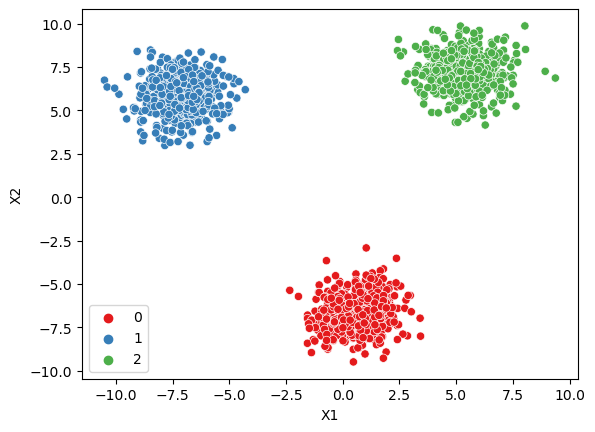

In [10]:
display_categories(kmeans,blobs)

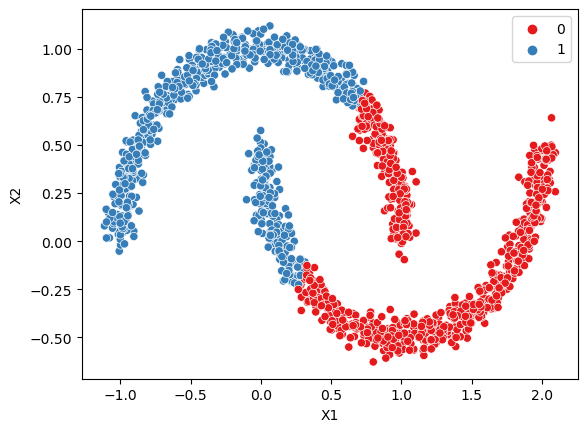

In [12]:
display_categories(kmeans,moons)

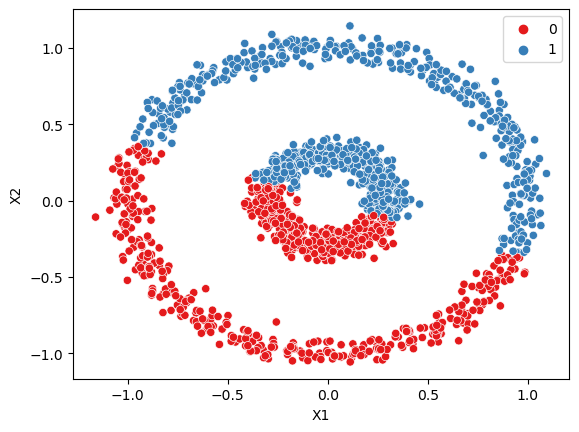

In [13]:
display_categories(kmeans,circles)

In [14]:
from sklearn.cluster import DBSCAN

In [25]:
dbscan = DBSCAN(eps=1.5)

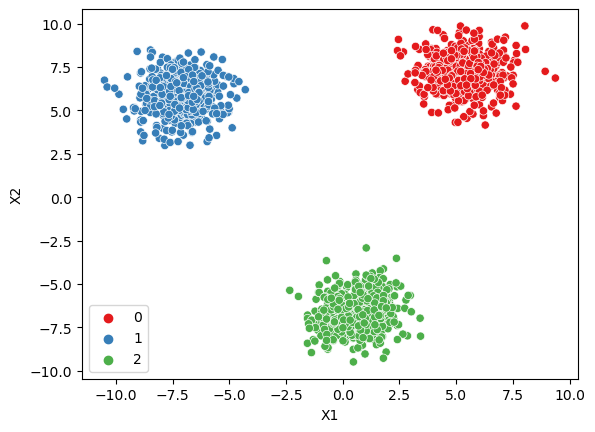

In [26]:
display_categories(dbscan,blobs)

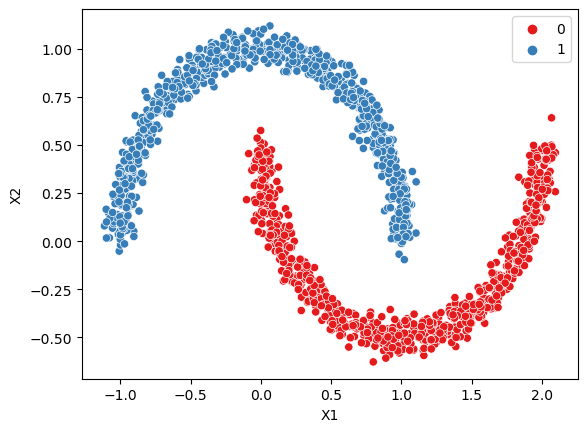

In [19]:
display_categories(dbscan,moons)

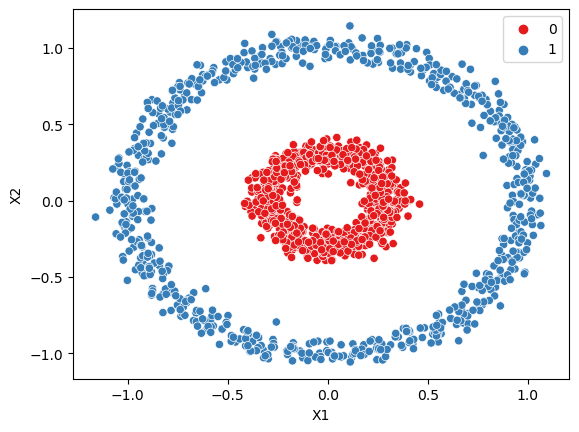

In [20]:
display_categories(dbscan,circles)

In [27]:
two_blobs = pd.read_csv('cluster_two_blobs.csv')

In [28]:
two_blobs_outliers = pd.read_csv('cluster_two_blobs_outliers.csv')

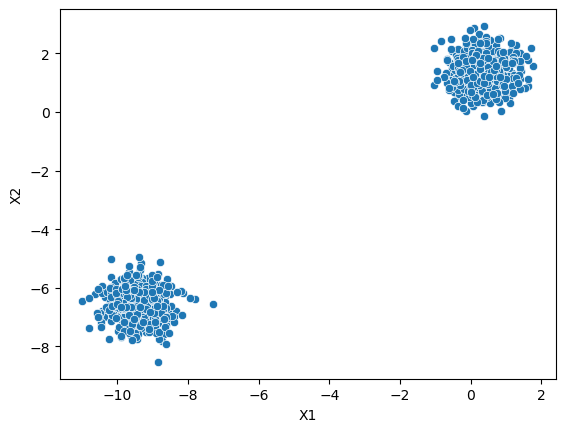

In [29]:
sns.scatterplot(data=two_blobs,x='X1',y='X2');

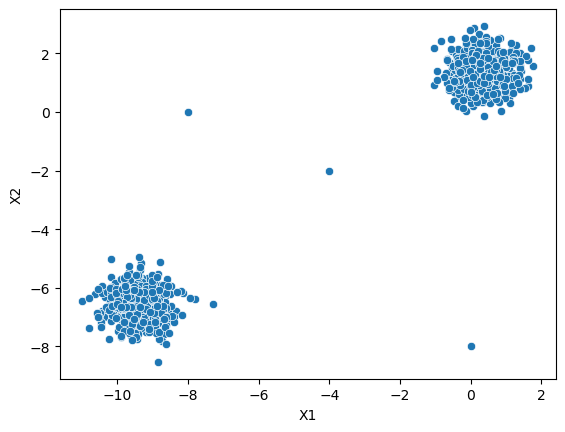

In [30]:
sns.scatterplot(data=two_blobs_outliers,x='X1',y='X2');

In [31]:
dbscan = DBSCAN()

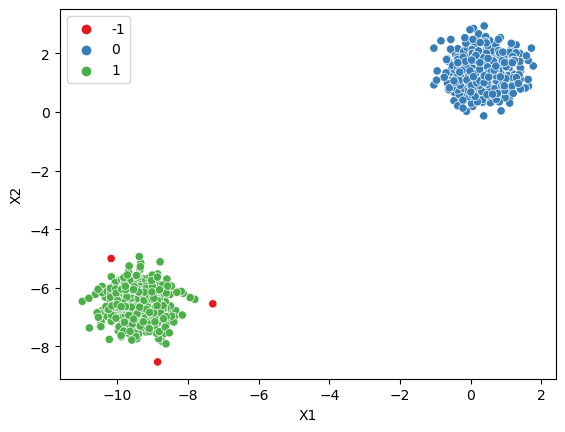

In [32]:
display_categories(dbscan,two_blobs)

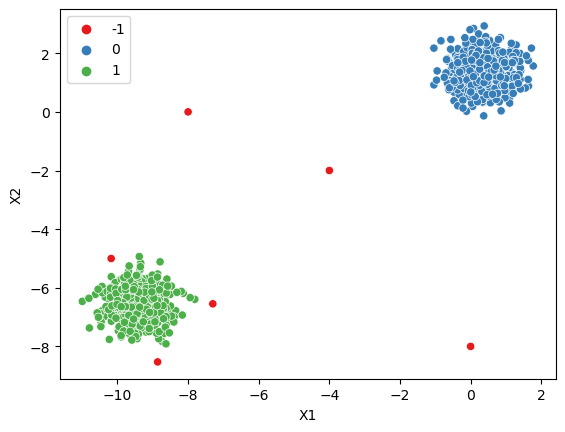

In [33]:
display_categories(dbscan,two_blobs_outliers)

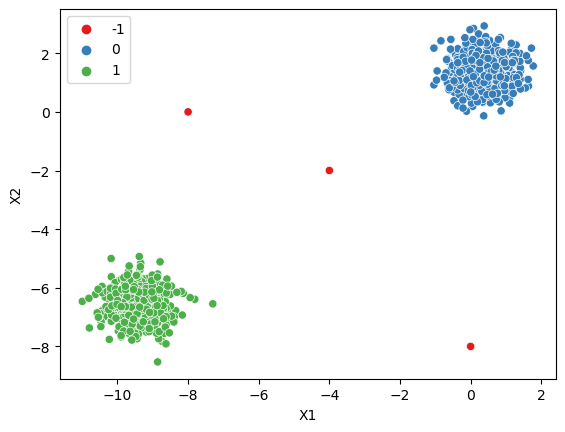

In [37]:
dbscan = DBSCAN(eps=1)
display_categories(dbscan,two_blobs_outliers)

In [38]:
np.sum(dbscan.labels_ == -1)

3

In [39]:
100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_)

0.29910269192422734

In [40]:
len(dbscan.labels_)

1003

In [42]:
outlier_percent = []
number_of_outliers = []

for eps in np.linspace(0.001,10,100):
    dbscan = DBSCAN(eps=eps)
    dbscan.fit(two_blobs_outliers)
    
    number_of_outliers.append(np.sum(dbscan.labels_ == -1))
    outlier_percent.append(100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_))

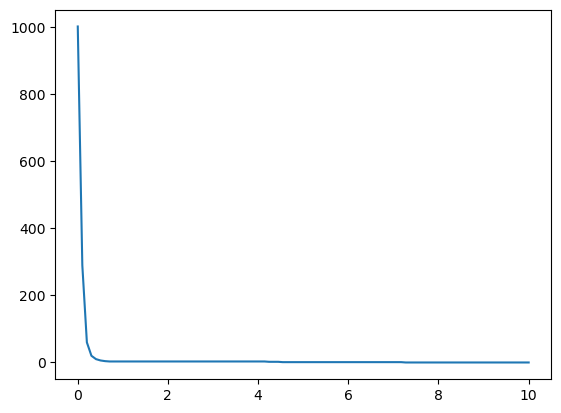

In [43]:
sns.lineplot(x=np.linspace(0.001,10,100),y=number_of_outliers);

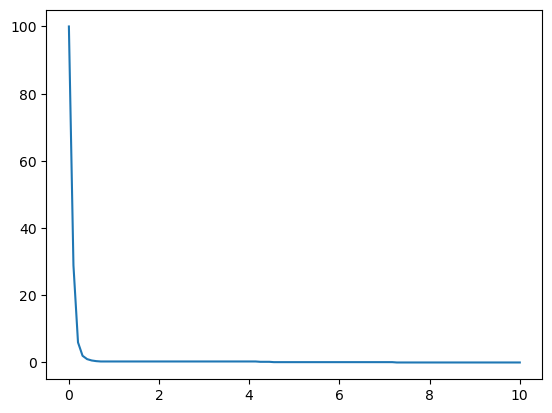

In [44]:
sns.lineplot(x=np.linspace(0.001,10,100),y=outlier_percent);

In [45]:
outlier_percent = []
number_of_outliers = []

for n in np.arange(1,100):
    dbscan = DBSCAN(min_samples=n)
    dbscan.fit(two_blobs_outliers)
    
    number_of_outliers.append(np.sum(dbscan.labels_ == -1))
    outlier_percent.append(100 * np.sum(dbscan.labels_ == -1) / len(dbscan.labels_))

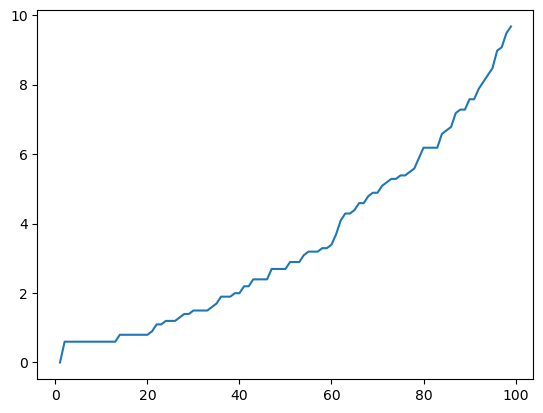

In [46]:
sns.lineplot(x=np.arange(1,100),y=outlier_percent);

# PCA

In [5]:
df = pd.read_csv('cancer_tumor_data_features.csv')
df.transpose()

,0,1,2,3,4,5,6,7,8,9,...,559,560,561,562,563,564,565,566,567,568
mean radius,17.990000,20.570000,19.690000,11.420000,20.290000,12.450000,18.250000,13.710000,13.000000,12.460000,...,11.510000,14.050000,11.200000,15.220000,20.920000,21.560000,20.130000,16.600000,20.600000,7.760000
mean texture,10.380000,17.770000,21.250000,20.380000,14.340000,15.700000,19.980000,20.830000,21.820000,24.040000,...,23.930000,27.150000,29.370000,30.620000,25.090000,22.390000,28.250000,28.080000,29.330000,24.540000
mean perimeter,122.800000,132.900000,130.000000,77.580000,135.100000,82.570000,119.600000,90.200000,87.500000,83.970000,...,74.520000,91.380000,70.670000,103.400000,143.000000,142.000000,131.200000,108.300000,140.100000,47.920000
mean area,1001.000000,1326.000000,1203.000000,386.100000,1297.000000,477.100000,1040.000000,577.900000,519.800000,475.900000,...,403.500000,600.400000,386.000000,716.900000,1347.000000,1479.000000,1261.000000,858.100000,1265.000000,181.000000
mean smoothness,0.118400,0.084740,0.109600,0.142500,0.100300,0.127800,0.094630,0.118900,0.127300,0.118600,...,0.092610,0.099290,0.074490,0.104800,0.109900,0.111000,0.097800,0.084550,0.117800,0.052630
mean compactness,0.277600,0.078640,0.159900,0.283900,0.132800,0.170000,0.109000,0.164500,0.193200,0.239600,...,0.102100,0.112600,0.035580,0.208700,0.223600,0.115900,0.103400,0.102300,0.277000,0.043620
mean concavity,0.300100,0.086900,0.197400,0.241400,0.198000,0.157800,0.112700,0.093660,0.185900,0.227300,...,0.111200,0.044620,0.000000,0.255000,0.317400,0.243900,0.144000,0.092510,0.351400,0.000000
mean concave points,0.147100,0.070170,0.127900,0.105200,0.104300,0.080890,0.074000,0.059850,0.093530,0.085430,...,0.041050,0.043040,0.000000,0.094290,0.147400,0.138900,0.097910,0.053020,0.152000,0.000000
mean symmetry,0.241900,0.181200,0.206900,0.259700,0.180900,0.208700,0.179400,0.219600,0.235000,0.203000,...,0.138800,0.153700,0.106000,0.212800,0.214900,0.172600,0.175200,0.159000,0.239700,0.158700
mean fractal dimension,0.078710,0.056670,0.059990,0.097440,0.058830,0.076130,0.057420,0.074510,0.073890,0.082430,...,0.065700,0.061710,0.055020,0.071520,0.068790,0.056230,0.055330,0.056480,0.070160,0.058840


In [6]:
scaler = StandardScaler()

In [7]:
scaled_X = scaler.fit_transform(df)

In [8]:
from sklearn.decomposition import PCA

In [9]:
pca_model = PCA(n_components=2)

In [11]:
pca_results = pca_model.fit_transform(scaled_X)

In [14]:
from sklearn.datasets import load_breast_cancer

In [17]:
cancer_dict = load_breast_cancer()

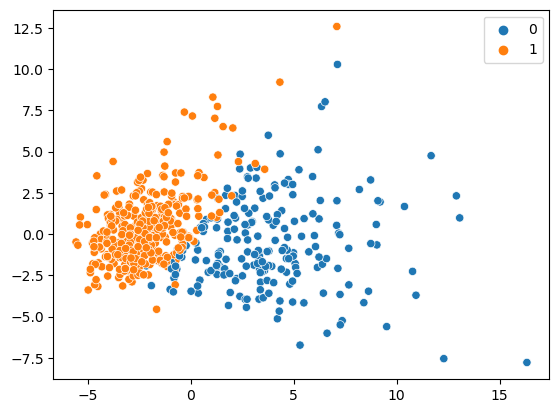

In [19]:
sns.scatterplot(x=pca_results[:,0],y=pca_results[:,1],hue=cancer_dict['target']);

In [20]:
pca_model.components_

array([[ 0.21890244,  0.10372458,  0.22753729,  0.22099499,  0.14258969,
         0.23928535,  0.25840048,  0.26085376,  0.13816696,  0.06436335,
         0.20597878,  0.01742803,  0.21132592,  0.20286964,  0.01453145,
         0.17039345,  0.15358979,  0.1834174 ,  0.04249842,  0.10256832,
         0.22799663,  0.10446933,  0.23663968,  0.22487053,  0.12795256,
         0.21009588,  0.22876753,  0.25088597,  0.12290456,  0.13178394],
       [-0.23385713, -0.05970609, -0.21518136, -0.23107671,  0.18611302,
         0.15189161,  0.06016536, -0.0347675 ,  0.19034877,  0.36657547,
        -0.10555215,  0.08997968, -0.08945723, -0.15229263,  0.20443045,
         0.2327159 ,  0.19720728,  0.13032156,  0.183848  ,  0.28009203,
        -0.21986638, -0.0454673 , -0.19987843, -0.21935186,  0.17230435,
         0.14359317,  0.09796411, -0.00825724,  0.14188335,  0.27533947]])

In [21]:
df_components = pd.DataFrame(pca_model.components_,index=['PC1','PC2'],columns=df.columns)

In [22]:
df_components

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
PC1,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,...,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
PC2,-0.233857,-0.059706,-0.215181,-0.231077,0.186113,0.151892,0.060165,-0.034768,0.190349,0.366575,...,-0.219866,-0.045467,-0.199878,-0.219352,0.172304,0.143593,0.097964,-0.008257,0.141883,0.275339


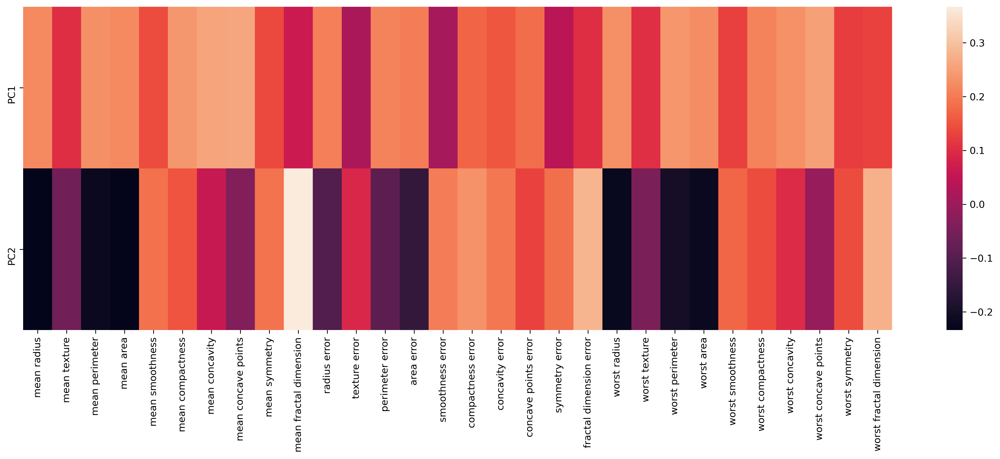

In [23]:
plt.figure(figsize=(20,6),dpi=300)
sns.heatmap(df_components);

In [24]:
pca_model.explained_variance_ratio_

array([0.44272026, 0.18971182])

In [25]:
np.sum(pca_model.explained_variance_ratio_)

0.6324320765155946

In [27]:
explained_varience = []

for n in range(1,31):
    pca = PCA(n_components=n)
    pca.fit(scaled_X)
    explained_varience.append(np.sum(pca.explained_variance_ratio_))

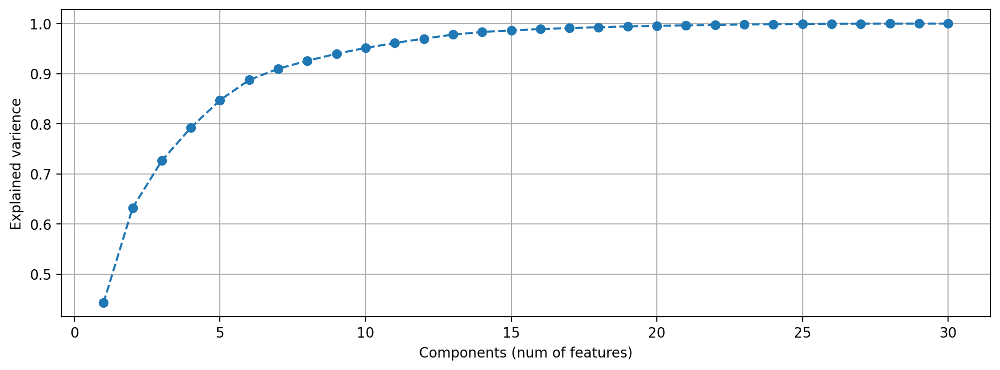

In [35]:
plt.figure(figsize=(12,4),dpi=200)
plt.plot(range(1,31),explained_varience,'o--')
plt.xlabel('Components (num of features)')
plt.ylabel('Explained varience')
plt.grid(True);